# 지역 특성으로 보스턴 주택가격을 설명할 수 있는가

**작성자:** bolly0809-coder | **작성일:** 2026-09-03

[프로젝트 요약 · 핵심 결과 · 참고자료 · 회고](README.md)

## 분석 개요

방 수·사회경제적 특성·환경·접근성 등 지역 특성과 주택가격 중앙값의 관계를 살펴보고, 전처리 단계별 선형회귀 모형의 적합도와 해석상의 한계를 비교한다.

- 데이터: Boston House Prices, 원본 규모 506행 × 14열 — 저장된 실행 출력에서 확인했다.
- 목표변수: `MEDV` (천 달러).
- 분석 흐름: 품질 점검 → 단변량·이변량·다변량 EDA → 전처리 5개 체크포인트 → OLS 후진소거 → 원본 척도 성능 비교 → 계수·가정 진단.

### 핵심 결과

중복·결측치가 없는 **506개 지역**을 분석했다. 다섯 체크포인트 중 **1_로그변환**을 선택했으며, 최종 독립변수는 10개였다. 원본 가격 척도 R² **0.777**, RMSE **4.336천 달러**, MAE **3.075천 달러**로 기준선 대비 RMSE가 약 **7.35% 감소**했다.

LSTAT는 최종 모형에서 가장 큰 절댓값의 표준화 계수를 보였다. 평균 방 수·강변 인접 여부는 양의 조건부 관계를 보였으나, DIS·RAD·ZN은 단독 상관과 회귀계수의 방향이 달랐다. 전처리를 누적하는 것 자체보다 **같은 단위의 오차, 변수 구성, 잔차 진단을 함께 읽는 것**이 중요했다. 이 결과는 현재 개별 매물의 시세 예측이나 인과효과를 검증한 것이 아니다.

### 공개 파일과 재실행 안내

- 공개 파일은 **README와 이 단일 노트북**이다. 실행된 표·그래프·결과 해석은 노트북 안에 포함되어 있다.
- `helpers`, 데이터 엑셀, 모델 파일은 이 폴더에 포함하지 않는다. 저장된 결과의 열람에는 별도 실행이 필요하지 않다.
- 재실행에는 별도로 보유한 `helpers`, `jussam` 및 관련 분석 패키지가 필요하다. 첫 경로 설정 셀도 본인 환경에 맞춰 수정해야 한다.


1. 이 프로젝트의 **새 Python 3.13 커널**에서 위에서부터 모두 실행한다. 두 프로젝트가 같은 커널의 변수·모듈 상태를 공유하지 않도록 각각 새 커널을 사용한다.
2. 첫 코드 셀은 로컬 작업 폴더와 `helpers` 경로만 설정한다. 통계 계산은 유지하고 자동 요약·해석의 표시 오류만 정정했다.
3. 전체 실행이 완료된 표·그래프를 보존하고 본문 해석과 README를 실제 결과로 확정했다. 저장된 결과를 열람하기 위해 다시 실행할 필요는 없다.
4. 단일 파일이므로 다른 노트북을 실행하는 `%run`만 없애고 앞 절의 변수 설정을 재사용한다.
5. 엑셀 저장은 현재 프로젝트 폴더 안에서 수행한다. EDA와 모델링은 원본대로 `jussam.load_data()`의 품질 점검 데이터·요약표·체크포인트를 다시 읽으며, 방금 저장한 로컬 엑셀을 자동으로 이어 읽지는 않는다.
6. 품질 점검 절의 `judge_log_transform`은 왜도·첨도만 사용하는 후보 규칙이다. 뒤 전처리에 쓰는 패키지 요약표의 log/log1p 분류와 동일한 산출물이라고 간주하지 않는다.

### 해석 범위

- 비교 지표는 적합에 사용한 **동일 표본 내 성능**이다. 새 데이터에 대한 예측 성능이나 인과효과로 해석하지 않는다. 원본에 없는 분할·교차검증·새 알고리즘을 추가하지 않았다.
- 종속변수가 달라지면 모델 척도 R²·AIC를 그대로 비교하지 않는다. 로그 모형은 원본 단위로 역변환한 RMSE·MAE·R²를 확인한다. 단순 지수 역변환에는 별도 재변환 편향 보정을 추가하지 않았다.
- HC3는 표준오차 보정이며 비선형성이나 이분산 자체를 해결하지 않는다. 검정의 비기각은 가정이나 집단 간 동일성을 입증하는 것이 아니다.
- DW는 행 순서에 의존한다. 횡단면 자료의 임의 순서에 대한 DW 값만으로 관측치의 독립성을 확정하지 않는다.
- IQR 이상치는 데이터 오류와 동의어가 아니다. 전처리의 경계값 대체·표준화 대상은 연속형 독립변수이며 종속변수에는 적용하지 않는다.


### 이 데이터에서 확인할 사항

- 관측 단위는 지역이며 `MEDV`는 자가 거주 주택가격 중앙값(천 달러)이다. 개별 매물의 실거래가나 현재 시세 예측으로 해석하지 않는다.
- `MEDV`의 50 상한 집중은 로그변환으로 해소되지 않는다. `B`는 인종 구성에 기반한 가공 지표이지 단순 비율이 아니며, 사회경제적 변수의 관계를 인과효과·차별적 의사결정 근거로 해석하지 않는다. 해당 변수를 임의로 삭제하지는 않았다.
- 전처리와 체크포인트의 `MEDV`는 `log` 변환이다. 모형 보고의 `log1p_y`를 `log_y`로, 역변환 `expm1`을 `exp`로 바로잡았다. 독립변수 `ZN`의 `log1p`는 그대로 유지했다.
- 원본 척도 RMSE 비교에서 `1_로그변환`의 선택 근거를 확인했다. 본문과 마지막 종합 해석에 실제 결과를 정리했다.

### 목차

- [1. 데이터 품질 점검과 기술통계](#quality)
- [2. 탐색적 데이터 분석 — 데이터와 변수 유형](#eda-start)
- [2-1. 단변량 분석](#univariate)
- [2-2. 이변량 분석](#bivariate)
- [2-3. 다변량 분석](#multivariate)
- [3. 분석용 데이터 전처리](#preprocessing)
- [4. 회귀모형 비교·해석·진단](#modeling)

### 로컬 실행 경로

In [1]:
from pathlib import Path
import os
import sys
from IPython.display import display, Markdown

# helpers 참조 위치와 엑셀 저장 위치를 이 프로젝트로 맞춘다.
project_dir = Path(r"C:\Users\jh\취준_데이터분석_0901\kaggle프로젝트\Boston Housing 주택가격 분석")
os.chdir(project_dir)
sys.path.insert(0, str(project_dir))
print("작업 폴더:", project_dir)


작업 폴더: C:\Users\jh\취준_데이터분석_0901\kaggle프로젝트\Boston Housing 주택가격 분석


<a id="quality"></a>

## 1. 데이터 품질 점검과 기술통계

### 준비작업

#### 1. 필요한 라이브러리 참조

In [2]:
import numpy as np
from jussam import load_data
from pandas import DataFrame, read_excel

📦 연세대학교 주영아 교수가 제작한 라이브러리를 사용중입니다.
📧 Email(1): j.purplerose@yonsei.ac.kr
📧 Email(2): j.purplerose@gmail.com
📝 Website: https://juyounga.kr/


#### 2. 데이터 불러오기

In [3]:
origin = load_data("boston")
origin.head()

📚 보스턴 인근 지역의 인구·환경·교육·범죄·세금 정보 등을 기반으로 주택의 중위가격(MEDV)을 예측하기 위해 수집된 대표적인 회귀 분석용 주택시장 데이터 (출처: https://www.kaggle.com/datasets/altavish/boston-housing-dataset)

    field    description
--  -------  ---------------------------------------------------------------------------------------------
 0  CRIM     타운별 1인당 범죄율 (Per capita crime rate by town)
 1  ZN       25,000 sqft 이상 주거용 대지 비율 (Proportion of residential land zoned for large lots)
 2  INDUS    비소매 상업구역 비율 (Proportion of non-retail business acres per town)
 3  CHAS     명목형, 찰스강 인접 여부 (Charles River dummy variable: 1 if tract bounds river; 0 otherwise)
 4  NOX      대기 오염 정도 (Nitric oxides concentration, parts per 10 million)
 5  RM       주택당 평균 방(Room) 수 (Average number of rooms per dwelling)
 6  AGE      1940년 이전 건축 비율 (Proportion of owner-occupied units built prior to 1940)
 7  DIS      5개 주요 고용센터까지의 거리 (Weighted distances to five Boston employment centers)
 8  RAD      고속도로 접근성 지수 (Index of accessibility to radial highways)
 9  T

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


### 자료형 점검

#### 1. 자료형 확인

In [4]:
origin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


#### 2. 자료형 변환

- CHAS는 범주형이므로 category 타입으로 변환

In [5]:
# 원본 데이터 프레임 복사
df1 = origin.copy()
df1["CHAS"] = df1["CHAS"].astype("category")
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   CRIM     506 non-null    float64 
 1   ZN       506 non-null    float64 
 2   INDUS    506 non-null    float64 
 3   CHAS     506 non-null    category
 4   NOX      506 non-null    float64 
 5   RM       506 non-null    float64 
 6   AGE      506 non-null    float64 
 7   DIS      506 non-null    float64 
 8   RAD      506 non-null    int64   
 9   TAX      506 non-null    int64   
 10  PTRATIO  506 non-null    float64 
 11  B        506 non-null    float64 
 12  LSTAT    506 non-null    float64 
 13  MEDV     506 non-null    float64 
dtypes: category(1), float64(11), int64(2)
memory usage: 52.1 KB


### 데이터 중복 점검

#### 1. 행단위 완전 중복 확인

- 중복된 행에 대하여 True로 표시하고, 중복되지 않은 행은 False로 표시한다.

In [6]:
dup = df1.duplicated()
dup

0      False
1      False
2      False
3      False
4      False
       ...  
501    False
502    False
503    False
504    False
505    False
Length: 506, dtype: bool

In [7]:
# 중복 데이터 개수
dup.sum()

np.int64(0)

#### 2. 중복 데이터 제거

- 여기서는 필요 없는 처리이지만 코드 학습을 위해 수행

In [8]:
df2 = df1.drop_duplicates()
df2.duplicated().sum()

np.int64(0)

### 형식·표기·단위 점검

#### 1. 명목형 변수의 단위 확인

- 명목형 변수는 고유값의 분포를 확인하는 것으로 단위 점검을 수행할 수 있다.

In [9]:
df2['CHAS'].value_counts()

CHAS
0    471
1     35
Name: count, dtype: int64

CHAS는 이미 0/1로 표현된 범주형 변수다. 뒤 전처리에서는 원본의 공통 라벨링·더미변수 처리 흐름을 그대로 수행한다.

#### 2. 연속형 변수의 단위 확인을 위한 변수명 추출

In [10]:
# 값을 검사 수치형 변수의 이름 추출
fields = df2.select_dtypes(include="number").columns.to_list()
print(fields)

['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']


#### 3. 연속형 변수의 단위 확인

- 값의 구간(최소,최대값)을 확인하여 데이터 명세와 비교해 본다.

In [11]:
minmax = [] # 최소값과 최대값을 저장할 리스트

for field in fields:
    min_value = df2[field].min()
    max_value = df2[field].max()
    minmax.append({"min": min_value, "max": max_value})

# 최소값과 최대값을 데이터 프레임으로 변환하여 출력
minmax_df = DataFrame(minmax, index=fields)
minmax_df

,min,max
CRIM,0.006,88.976
ZN,0.000,100.000
INDUS,0.460,27.740
NOX,0.385,0.871
RM,3.561,8.780
AGE,2.900,100.000
DIS,1.130,12.127
RAD,1.000,24.000
TAX,187.000,711.000
PTRATIO,12.600,22.000


### 결측치 점검

#### 1. 결측치 확인

- 데이터프레임 객체(df2)의 isna() 메서드는 결측치인 경우 True, 결측치가 아닌 경우 False로 채워진 데이터프레임을 반환한다.
- 결측치 여부를 담고 있는 데이터프레임을 sum() 메서드로 집계하면 True를 1, False를 0으로 환산하여 열 단위로 집계하는데 이는 열 단위의 결측치 수를 의미한다.

In [12]:
na_count = df2.isna().sum()
na_count

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

#### 2. 결측치 비율 계산을 위한 데이터 크기 확인

- 이미 앞 과정에서 결측치 없음이 확인되었지만 결측치가 있는 상황을 가정해서 코드 실습을 위해 진행함

In [13]:
# 데이터의 행과 열의 수 확인
rows, cols = df2.shape
print(f"rows: {rows}, cols: {cols}")

rows: 506, cols: 14


#### 결측치 비율 확인

결측치 비율을 확인한다. 비율이 낮다는 이유만으로 삭제가 안전하다고 단정하지 않으며, 이번 데이터의 실제 결측치 출력부터 확인한다.

In [14]:
na_ratio = na_count / rows
na_ratio

CRIM      0.000
ZN        0.000
INDUS     0.000
CHAS      0.000
NOX       0.000
RM        0.000
AGE       0.000
DIS       0.000
RAD       0.000
TAX       0.000
PTRATIO   0.000
B         0.000
LSTAT     0.000
MEDV      0.000
dtype: float64

### 품질 점검 결과 데이터셋 저장

- 다음 분석 과정에서 이어서 진행할 수 있도록 품질 점검이 완료된 데이터 셋을 저장한다.

In [15]:
df2.to_excel("boston_qtcheck.xlsx", index=False)

### 기술 통계량 확인 준비작업

#### 1. 데이터 불러오기

- 실제 분석 과정에서는 새로운 jupyter 파일을 생성하고 앞 단계에서 저장한 데이터를 불러와서 진행하는 것을 권장

In [16]:
#origin_qt = read_excel("boston_qtcheck.xlsx")

# 수업용 자료이므로 라이브러리를 통해서도 로드 가능함
origin_qt = load_data("boston_qtcheck")

📚 보스턴 주택 가격 데이터셋의 품질 검사 완료 버전 (출처: 자체 정제)

    field    description
--  -------  ---------------------------------------------------------------------------------------------
 0  CRIM     타운별 1인당 범죄율 (Per capita crime rate by town)
 1  ZN       25,000 sqft 이상 주거용 대지 비율 (Proportion of residential land zoned for large lots)
 2  INDUS    비소매 상업구역 비율 (Proportion of non-retail business acres per town)
 3  CHAS     명목형, 찰스강 인접 여부 (Charles River dummy variable: 1 if tract bounds river; 0 otherwise)
 4  NOX      대기 오염 정도 (Nitric oxides concentration, parts per 10 million)
 5  RM       주택당 평균 방(Room) 수 (Average number of rooms per dwelling)
 6  AGE      1940년 이전 건축 비율 (Proportion of owner-occupied units built prior to 1940)
 7  DIS      5개 주요 고용센터까지의 거리 (Weighted distances to five Boston employment centers)
 8  RAD      고속도로 접근성 지수 (Index of accessibility to radial highways)
 9  TAX      재산세율 (Full-value property-tax rate per $10,000)
10  PTRATIO  교육구 학생-교사 비율 (Pupil–teacher ratio by town)
11  

#### 2. 타입변환

- category 타입으로의 변환은 데이터를 불러올 때 마다 진행해야 한다.

In [17]:
df3 = origin_qt.copy()
df3['CHAS'] = df3['CHAS'].astype('category')
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   CRIM     506 non-null    float64 
 1   ZN       506 non-null    float64 
 2   INDUS    506 non-null    float64 
 3   CHAS     506 non-null    category
 4   NOX      506 non-null    float64 
 5   RM       506 non-null    float64 
 6   AGE      506 non-null    float64 
 7   DIS      506 non-null    float64 
 8   RAD      506 non-null    int64   
 9   TAX      506 non-null    int64   
 10  PTRATIO  506 non-null    float64 
 11  B        506 non-null    float64 
 12  LSTAT    506 non-null    float64 
 13  MEDV     506 non-null    float64 
dtypes: category(1), float64(11), int64(2)
memory usage: 52.1 KB


### 기술 통계량 표 생성

#### 1. 연속형 변수의 기술 통계량 표

- 명목형 변수는 자동으로 제외된다.

In [18]:
# T는 데이터프레임의 행과 열을 바꿔주는 역할
desc_df = df3.describe().T
desc_df

,count,mean,std,min,25%,50%,75%,max
CRIM,506.000,3.614,8.602,0.006,0.082,0.257,3.677,88.976
ZN,506.000,11.364,23.322,0.000,0.000,0.000,12.500,100.000
INDUS,506.000,11.137,6.860,0.460,5.190,9.690,18.100,27.740
NOX,506.000,0.555,0.116,0.385,0.449,0.538,0.624,0.871
RM,506.000,6.285,0.703,3.561,5.885,6.208,6.623,8.780
AGE,506.000,68.575,28.149,2.900,45.025,77.500,94.075,100.000
DIS,506.000,3.795,2.106,1.130,2.100,3.207,5.188,12.127
RAD,506.000,9.549,8.707,1.000,4.000,5.000,24.000,24.000
TAX,506.000,408.237,168.537,187.000,279.000,330.000,666.000,711.000
PTRATIO,506.000,18.456,2.165,12.600,17.400,19.050,20.200,22.000


#### 2. 명목형 변수의 기술 통계량 표

- 데이터의 수(count), 값의 종류 수(unique), 최빈값(top), 최빈값의 수(freq)를 알 수 있다.

In [19]:
cate_desc_df = df3.describe(include='category').T
cate_desc_df

,count,unique,top,freq
CHAS,506,2,0,471


#### 3. 명목형 변수 기술 통계량

- 명목형 변수는 값의 종류별로 데이터 수와 비율을 확인할 수 있다.

In [20]:
# 명목형 변수의 필드명 추출
cate_fields = df3.select_dtypes(include='category').columns

# 명목형 변수의 고유값과 빈도수 계산
for field in cate_fields:
    # 값의 종류별 개수
    vcount = df3[field].value_counts()
    # 전체 데이터 길이 대비 비율
    percent = vcount / df3.shape[0]

    # 결과 저장
    df = DataFrame({'count': vcount, 'percent': percent})
    # 결과 출력
    display(df)

,count,percent
CHAS,,
0,471,0.931
1,35,0.069


### 중심 수준 파악

#### 1. **평균-중앙값의 상대 차이율** 계산

- 평균-중앙값 상대 차이율 = |평균 - 중앙값| / 중앙값

| 구간 | 의미 |
|--------|-----------------|
| 0 이상 0.1 미만 | 평균과 중앙값이 거의 비슷함 |
| 0.1 이상 0.5 미만 | 약간 차이 있음        |
| 0.5 이상 | 차이 큼, 왜도·극단값 의심 |

In [21]:
# "평균-중앙값 상대 차이율 = |평균 - 중앙값| / 중앙값" 컬럼 추가
desc_df['rel_diff'] = abs(desc_df['mean'] - desc_df['50%']) / desc_df['50%']

# 상대 차이율 의미 컬럼 추가
conditions = [desc_df['rel_diff'] < 0.1, desc_df['rel_diff'] < 0.5]
choices = ['similar', 'diff']
desc_df['rdiff_flag'] = np.select(conditions, choices, default='large_diff')

# 필요한 컬럼만 선택하여 출력
desc_df[['mean', '50%', 'rel_diff', 'rdiff_flag']]

,mean,50%,rel_diff,rdiff_flag
CRIM,3.614,0.257,13.087,large_diff
ZN,11.364,0.000,inf,large_diff
INDUS,11.137,9.690,0.149,diff
NOX,0.555,0.538,0.031,similar
RM,6.285,6.208,0.012,similar
AGE,68.575,77.500,0.115,diff
DIS,3.795,3.207,0.183,diff
RAD,9.549,5.000,0.910,large_diff
TAX,408.237,330.000,0.237,diff
PTRATIO,18.456,19.050,0.031,similar


### 이상치 신호 탐지

#### 1. IQR, 이상치 경계값 계산

In [22]:
# iqr
desc_df['iqr'] = desc_df['75%'] - desc_df['25%']

# 상한 이상치 경계
desc_df['upper_bound'] = desc_df['75%'] + 1.5 * desc_df['iqr']

# 하한 이상치 경계
desc_df['lower_bound'] = desc_df['25%'] - 1.5 * desc_df['iqr']

# 필요한 컬럼만 선택하여 출력
desc_df[['iqr', 'upper_bound', 'lower_bound']]

,iqr,upper_bound,lower_bound
CRIM,3.595,9.070,-5.311
ZN,12.500,31.250,-18.750
INDUS,12.910,37.465,-14.175
NOX,0.175,0.886,0.187
RM,0.738,7.731,4.778
AGE,49.050,167.650,-28.550
DIS,3.088,9.821,-2.532
RAD,20.000,54.000,-26.000
TAX,387.000,1246.500,-301.500
PTRATIO,2.800,24.400,13.200


#### 2. 명목형 변수를 제외한 데이터 프레임

- 이상치는 연속형 변수에 대한 개념이므로 명목형 변수를 제외한 데이터프레임 생성

In [23]:
# 명목형 변수의 필드명 추출
cate_fields = df3.select_dtypes(include='category').columns

df4 = df3.drop(columns=cate_fields)
df4.head()

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


#### 3. 상한 이상치 탐지

In [24]:
# 상한 이상치 수
desc_df['upper_outliers'] = ((df4 > desc_df['upper_bound'])).sum()

# 상한 이상치 수 비율
desc_df['upper_outliers_ratio'] = desc_df['upper_outliers'] / df4.shape[0]

# 필요한 컬럼만 선택하여 출력
desc_df[['upper_outliers', 'upper_outliers_ratio']]

,upper_outliers,upper_outliers_ratio
CRIM,66,0.130
ZN,68,0.134
INDUS,0,0.000
NOX,0,0.000
RM,22,0.043
AGE,0,0.000
DIS,5,0.010
RAD,0,0.000
TAX,0,0.000
PTRATIO,0,0.000


#### 4. 하한 이상치 탐지

In [25]:
# 하한 이상치 수
desc_df['lower_outliers'] = (df4 < desc_df['lower_bound']).sum()

# 하한 이상치 수 비율
desc_df['lower_outliers_ratio'] = desc_df['lower_outliers'] / df4.shape[0]

# 필요한 컬럼만 선택하여 출력
desc_df[['lower_outliers', 'lower_outliers_ratio']]

,lower_outliers,lower_outliers_ratio
CRIM,0,0.000
ZN,0,0.000
INDUS,0,0.000
NOX,0,0.000
RM,8,0.016
AGE,0,0.000
DIS,0,0.000
RAD,0,0.000
TAX,0,0.000
PTRATIO,15,0.030


#### 5. 전체 이상치 집계

In [26]:
# 통합 이상치 수
desc_df['outliers'] = desc_df['upper_outliers'] + desc_df['lower_outliers']

# 통합 이상치 수 비율
desc_df['outliers_ratio'] = desc_df['outliers'] / df3.shape[0]

# 이상치 탐지 결과 확인
desc_df[['upper_outliers', 'upper_outliers_ratio', 
         'lower_outliers', 'lower_outliers_ratio', 
         'outliers', 'outliers_ratio']]

,upper_outliers,upper_outliers_ratio,lower_outliers,lower_outliers_ratio,outliers,outliers_ratio
CRIM,66,0.130,0,0.000,66,0.130
ZN,68,0.134,0,0.000,68,0.134
INDUS,0,0.000,0,0.000,0,0.000
NOX,0,0.000,0,0.000,0,0.000
RM,22,0.043,8,0.016,30,0.059
AGE,0,0.000,0,0.000,0,0.000
DIS,5,0.010,0,0.000,5,0.010
RAD,0,0.000,0,0.000,0,0.000
TAX,0,0.000,0,0.000,0,0.000
PTRATIO,0,0.000,15,0.030,15,0.030


### 비대칭 신호 확인

#### 1. 왜도 점검

In [27]:
# 왜도 계산
desc_df['skew'] = df4.skew()

# 왜도를 통한 분포 형태 해석
conditions_skew = [(desc_df['skew'] < -0.5), (desc_df['skew'] > 0.5)]
choices_skew = ['left tail', 'right tail']
desc_df['skew_interpret'] = np.select(conditions_skew, choices_skew,
                                    default='symmetric')

# 필요한 컬럼만 선택하여 출력
desc_df[['skew', 'skew_interpret']]

,skew,skew_interpret
CRIM,5.223,right tail
ZN,2.226,right tail
INDUS,0.295,symmetric
NOX,0.729,right tail
RM,0.404,symmetric
AGE,-0.599,left tail
DIS,1.012,right tail
RAD,1.005,right tail
TAX,0.670,right tail
PTRATIO,-0.802,left tail


#### 2. 첨도 점검

In [28]:
# 첨도 계산
desc_df['kurt'] = df4.kurt()

# 첨도를 통한 분포 형태 해석
conditions_kurt = [(desc_df['kurt'] < 0), (desc_df['kurt'] > 0)]
choices_kurt = ['platykurtic', 'leptokurtic']
desc_df['kurt_interpret'] = np.select(conditions_kurt, choices_kurt,
                                    default='mesokurtic')

# 필요한 컬럼만 선택하여 출력
desc_df[['kurt', 'kurt_interpret']]

,kurt,kurt_interpret
CRIM,37.131,leptokurtic
ZN,4.032,leptokurtic
INDUS,-1.234,platykurtic
NOX,-0.065,platykurtic
RM,1.892,leptokurtic
AGE,-0.968,platykurtic
DIS,0.488,leptokurtic
RAD,-0.867,platykurtic
TAX,-1.142,platykurtic
PTRATIO,-0.285,platykurtic


#### 3. 로그 변환 필요성 판단 함수 정의

In [29]:
def judge_log_transform(skew, kurt):
    if skew >= 1:                        # 강한 우측 꼬리 분포
        return "log1p"
    elif skew > 0.5 and kurt > 0:       # 우측 꼬리 분포이면서 첨도가 높은 경우
        return "log1p"
    elif skew <= -1:                    # 강한 좌측 꼬리 분포
        return "reverse_log1p"
    elif skew < -0.5 and kurt > 0:      # 좌측 꼬리 분포이면서 첨도가 높은 경우
        return "reverse_log1p"
    else:                               # 대칭 분포
        return "none"

#### 4. 로그 변환 필요성 판정

In [30]:
desc_df['log_need'] = desc_df.apply(lambda row: judge_log_transform( row['skew'], row['kurt']), axis=1)

# 로그 변환 필요성 결과 확인
desc_df[['skew', 'kurt', 'log_need']]

,skew,kurt,log_need
CRIM,5.223,37.131,log1p
ZN,2.226,4.032,log1p
INDUS,0.295,-1.234,none
NOX,0.729,-0.065,none
RM,0.404,1.892,none
AGE,-0.599,-0.968,none
DIS,1.012,0.488,log1p
RAD,1.005,-0.867,log1p
TAX,0.670,-1.142,none
PTRATIO,-0.802,-0.285,none


### 최종 기술 통계량 확인

#### 1. 최종 통계량 표 확인

In [31]:
desc_df.T

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000
mean,3.614,11.364,11.137,0.555,6.285,68.575,3.795,9.549,408.237,18.456,356.674,12.653,22.533
std,8.602,23.322,6.860,0.116,0.703,28.149,2.106,8.707,168.537,2.165,91.295,7.141,9.197
min,0.006,0.000,0.460,0.385,3.561,2.900,1.130,1.000,187.000,12.600,0.320,1.730,5.000
25%,0.082,0.000,5.190,0.449,5.885,45.025,2.100,4.000,279.000,17.400,375.377,6.950,17.025
50%,0.257,0.000,9.690,0.538,6.208,77.500,3.207,5.000,330.000,19.050,391.440,11.360,21.200
75%,3.677,12.500,18.100,0.624,6.623,94.075,5.188,24.000,666.000,20.200,396.225,16.955,25.000
max,88.976,100.000,27.740,0.871,8.780,100.000,12.127,24.000,711.000,22.000,396.900,37.970,50.000
rel_diff,13.087,inf,0.149,0.031,0.012,0.115,0.183,0.910,0.237,0.031,0.089,0.114,0.063
rdiff_flag,large_diff,large_diff,diff,similar,similar,diff,diff,large_diff,diff,similar,similar,diff,similar


#### 2. 기술 통계량 표 저장

In [32]:
desc_df.to_excel("boston_qtcheck_desc.xlsx")

#### 품질 점검 결과 해석

- 저장된 실행 결과에서 CRIM의 상단 IQR 이상치는 66개(약 13%)였다. 이 비율을 최댓값/중앙값의 배수로 읽지 않는다. 큰 양의 왜도와 첨도는 오른쪽 꼬리와 극단값 점검의 근거다.
- ZN은 0이 많이 포함된 변수다. **중앙값이 0**이면 평균–중앙값 상대 차이율은 정의되지 않아 `inf`가 출력될 수 있다. 이는 원자료에 무한대 값이 있다는 뜻이 아니다.
- CRIM·ZN·DIS·RAD·LSTAT·MEDV는 오른쪽 치우침을, B는 왼쪽 치우침을 점검한다. 변환 여부는 기술통계의 후보 판정과 실제 모형 비교를 구분한다.
- IQR 이상치가 없거나 평균과 중앙값이 가깝다는 사실만으로 정규분포·균등분포를 확정하지 않는다. INDUS·TAX의 군집, RM의 중심 집중, NOX·AGE·PTRATIO의 모양은 뒤 그래프에서 함께 확인한다.
- MEDV의 50 상한 집중은 가격의 상단 정보가 제한된 구조다. 로그변환의 후보이지만 변환만으로 이 문제를 해결했다고 보지 않는다.

<a id="eda-start"></a>

## 2. 탐색적 데이터 분석 — 데이터와 변수 유형

### 준비작업

#### 1. 라이브러리 참조

In [33]:
from jussam import load_data
from helpers import *

#### 2. 품질 점검 완료 데이터 가져오기

- 패키지에 포함된 품질 점검 완료 데이터셋을 불러온다.

In [34]:
origin = load_data("boston_qtcheck")
origin.head()

📚 보스턴 주택 가격 데이터셋의 품질 검사 완료 버전 (출처: 자체 정제)

    field    description
--  -------  ---------------------------------------------------------------------------------------------
 0  CRIM     타운별 1인당 범죄율 (Per capita crime rate by town)
 1  ZN       25,000 sqft 이상 주거용 대지 비율 (Proportion of residential land zoned for large lots)
 2  INDUS    비소매 상업구역 비율 (Proportion of non-retail business acres per town)
 3  CHAS     명목형, 찰스강 인접 여부 (Charles River dummy variable: 1 if tract bounds river; 0 otherwise)
 4  NOX      대기 오염 정도 (Nitric oxides concentration, parts per 10 million)
 5  RM       주택당 평균 방(Room) 수 (Average number of rooms per dwelling)
 6  AGE      1940년 이전 건축 비율 (Proportion of owner-occupied units built prior to 1940)
 7  DIS      5개 주요 고용센터까지의 거리 (Weighted distances to five Boston employment centers)
 8  RAD      고속도로 접근성 지수 (Index of accessibility to radial highways)
 9  TAX      재산세율 (Full-value property-tax rate per $10,000)
10  PTRATIO  교육구 학생-교사 비율 (Pupil–teacher ratio by town)
11  

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


#### 3. 연속형 변수의 기술 통계량 가져오기

- 패키지에 포함된 품질 점검 완료 기술 통계량 표를 불러온다.
  - 실제 데이터 분석 프로젝트에서는 엑셀 파일로 저장해 두고 필요할 때 마다 열람하자.

In [35]:
desc = load_data("boston_qtcheck_desc")
desc.T

📚 보스턴 주택 가격 데이터셋의 품질 검사 완료 버전에 대한 기술통계량 표


,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000
mean,3.614,11.364,11.137,0.555,6.285,68.575,3.795,9.549,408.237,18.456,356.674,12.653,22.533
std,8.602,23.322,6.860,0.116,0.703,28.149,2.106,8.707,168.537,2.165,91.295,7.141,9.197
min,0.006,0.000,0.460,0.385,3.561,2.900,1.130,1.000,187.000,12.600,0.320,1.730,5.000
25%,0.082,0.000,5.190,0.449,5.885,45.025,2.100,4.000,279.000,17.400,375.377,6.950,17.025
50%,0.257,0.000,9.690,0.538,6.208,77.500,3.207,5.000,330.000,19.050,391.440,11.360,21.200
75%,3.677,12.500,18.100,0.624,6.623,94.075,5.188,24.000,666.000,20.200,396.225,16.955,25.000
max,88.976,100.000,27.740,0.871,8.780,100.000,12.127,24.000,711.000,22.000,396.900,37.970,50.000
rel_diff,13.087,inf,0.149,0.031,0.012,0.115,0.183,0.910,0.237,0.031,0.089,0.114,0.063
rdiff_flag,large_diff,large_diff,diff,similar,similar,diff,diff,large_diff,diff,similar,similar,diff,similar


##### 결과 해석

- **로그변환을 고려해야 할 변수** : CRIM, ZN, DIS, RAD, LSTAT, MEDV
- **역 로그변환을 고려해야 할 변수** : B

#### 4. 명목형 변수의 기술 통계량 가져오기

- 패키지에 포함된 품질 점검 완료 기술 통계량 표를 불러온다.
  - 실제 데이터 분석 프로젝트에서는 엑셀 파일로 저장해 두고 필요할 때 마다 열람하자.

In [36]:
cat_desc = load_data("boston_qtcheck_category_desc")
cat_desc

📚 보스턴 주택 가격 데이터셋의 품질 검사 완료 버전에 대한 범주형 변수 기술통계량 표


,CHAS
count,506
unique,2
top,0
freq,471


##### 범주형 변수의 구성

CHAS는 비인접 지역 471개(93.1%)와 강변 인접 지역 35개(6.9%)로 불균형했다. 두 집단 비교에서는 표본 비율만 보고 버리지 않고 가정 점검 후 Mann–Whitney U 검정을 적용했다. 검정력을 별도 계산하지 않았으므로 집단 크기만으로 낮은 검정력을 확정하지 않는다. 강변 인접의 조건부 관계는 다른 지역 특성을 포함한 회귀 결과와 함께 해석한다.

#### 5. 타입 변환 (명목형 확정)

- 명목형 기술통계량 표의 컬럼명이 명목형 변수 목록이다.

In [37]:
df = my_qtcheck.set_type(origin, as_category=cat_desc.columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   CRIM     506 non-null    float64 
 1   ZN       506 non-null    float64 
 2   INDUS    506 non-null    float64 
 3   CHAS     506 non-null    category
 4   NOX      506 non-null    float64 
 5   RM       506 non-null    float64 
 6   AGE      506 non-null    float64 
 7   DIS      506 non-null    float64 
 8   RAD      506 non-null    int64   
 9   TAX      506 non-null    int64   
 10  PTRATIO  506 non-null    float64 
 11  B        506 non-null    float64 
 12  LSTAT    506 non-null    float64 
 13  MEDV     506 non-null    float64 
dtypes: category(1), float64(11), int64(2)
memory usage: 52.1 KB


#### 6. 변수 유형 분류

- EDA 시작 전 **종속변수**와 **변수 유형**을 분류한다
- **이 분류가 모든 분석 선택을 결정**한다.

In [38]:
# 종속변수
target = "MEDV"
# 종속변수 연속형 여부
target_is_continuous = True

# 명목형 변수
nominal_cols = my_qtcheck.get_categorical_column_names(df)
# 연속형 변수
continuous_cols = my_qtcheck.get_number_column_names(df)

if target_is_continuous:
    # 연속형 변수 이름에서 종속변수 항목 제거
    continuous_cols.remove(target)
else:
    # 명목형 변수 이름에서 종속변수 항목 제거
    nominal_cols.remove(target)

print("종속변수 :", target)
print("종속변수 유형: " + ("연속형" if target_is_continuous else "명목형"))
print("명목형   :", nominal_cols)
print("연속형   :", continuous_cols)

종속변수 : MEDV
종속변수 유형: 연속형
명목형   : ['CHAS']
연속형   : ['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT']


#### 7. 컬럼 의미를 정리한 딕셔너리

- 결과 출력시 의미를 함께 표시하기 위해 컬럼 의미를 정리해둔다.

In [39]:
column_means = {
    "CRIM": "범죄율",
    "ZN": "대규모주거지비율",
    "INDUS": "비소매상업지비율",
    "CHAS": "찰스강인접여부",
    "NOX": "대기오염도",
    "RM": "평균방수",
    "AGE": "노후주택비율",
    "DIS": "고용센터거리",
    "RAD": "고속도로접근성",
    "TAX": "재산세율",
    "PTRATIO": "학생교사비율",
    "B": "흑인비율지수",
    "LSTAT": "저소득층비율",
    "MEDV": "주택가격중앙값"
}

#### 8. EDA 범위

- 이 분류의 목적은 **선형회귀·머신러닝 모델에 투입할 독립변수를 채택**하는 것이다.
- 따라서 검정은 두 가지 질문으로 나뉜다.
  - **채택 기준** : 종속변수 × 독립변수 → 이 변수가 **종속변수를 설명하는가**
  - **제거 기준** : 독립변수 × 독립변수 → 이 변수가 **다른 독립변수와 중복인가**
- **변수 유형의 조합이 검정 방법을 결정**한다.

| 종속유형      | 독립유형      | 분석 유형 | 대상 변수               | 적용 여부 | 비고            |
|-----------|-----------|-------|---------------------|-------|---------------|
| 연속형       | 연속형       | 상관분석  | 연속형 독립변수 12종 → MEDV | ✅ 적용  | 종속·설명 모두 연속형  |
| 연속형       | 명목형(2집단)  | Mann–Whitney U   | CHAS → MEDV         | ✅ 적용  | CHAS가 이진변수    |
| 연속형       | 명목형(3집단+) | ANOVA | —                   | ❌ 미적용 | 3집단 이상 명목형 없음 |
| 명목형(2집단)  | 연속형       | T검정   | —                   | ❌ 미적용 | 종속변수 타입이 연속형  |
| 명목형(2집단)  | 명목형(2집단)  | 교차분석  | —                   | ❌ 미적용 | 종속변수 타입이 연속형  |
| 명목형(2집단)  | 명목형(3집단+) | 교차분석  | —                   | ❌ 미적용 | 종속변수 타입이 연속형  |
| 명목형(3집단+) | 연속형       | ANOVA | —                   | ❌ 미적용 | 종속변수 타입이 연속형  |
| 명목형(3집단+) | 명목형(2집단)  | 교차분석  | —                   | ❌ 미적용 | 종속변수 타입이 연속형  |
| 명목형(3집단+) | 명목형(3집단+) | 교차분석  | —                   | ❌ 미적용 | 종속변수 타입이 연속형  |

<a id="univariate"></a>

## 2-1. 단변량 분석

### 준비작업

### 앞 절의 분석 설정 재사용

동일 노트북 앞 절에서 불러온 데이터와 변수 유형 설정을 사용한다.

#### 2. 불러온 내용 확인

- 이전 분석 내역이 잘 로드 되었는지 확인한다.

In [40]:
print("종속변수 :", target)
print("종속변수 유형: " + ("연속형" if target_is_continuous else "명목형"))
print("연속형   :", continuous_cols)
print("명목형   :", nominal_cols)

display(df.head())
display(desc.head())
display(cat_desc.head())

종속변수 : MEDV
종속변수 유형: 연속형
연속형   : ['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT']
명목형   : ['CHAS']


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


,count,mean,std,min,25%,50%,75%,max,rel_diff,rdiff_flag,iqr,upper_bound,lower_bound,upper_outliers,upper_outliers_ratio,lower_outliers,lower_outliers_ratio,outliers,outliers_ratio,skew,skew_interpret,kurt,kurt_interpret,log_need
CRIM,506.000,3.614,8.602,0.006,0.082,0.257,3.677,88.976,13.087,large_diff,3.595,9.070,-5.311,66,0.130,0,0.000,66,0.130,5.223,right tail,37.131,leptokurtic,log
ZN,506.000,11.364,23.322,0.000,0.000,0.000,12.500,100.000,inf,large_diff,12.500,31.250,-18.750,68,0.134,0,0.000,68,0.134,2.226,right tail,4.032,leptokurtic,log1p
INDUS,506.000,11.137,6.860,0.460,5.190,9.690,18.100,27.740,0.149,diff,12.910,37.465,-14.175,0,0.000,0,0.000,0,0.000,0.295,symmetric,-1.234,platykurtic,none
NOX,506.000,0.555,0.116,0.385,0.449,0.538,0.624,0.871,0.031,similar,0.175,0.886,0.187,0,0.000,0,0.000,0,0.000,0.729,right tail,-0.065,platykurtic,none
RM,506.000,6.285,0.703,3.561,5.885,6.208,6.623,8.780,0.012,similar,0.738,7.731,4.778,22,0.043,8,0.016,30,0.059,0.404,symmetric,1.892,leptokurtic,none


,CHAS
count,506
unique,2
top,0
freq,471


#### 3. 라이브러리 참조하기

- 불러온 ipynb 파일에서 참조하지 않는 라이브러리중 필요한 것을 참조한다.
  - 여기서는 새로운 라이브러리의 참조는 불필요하지만,    
    라이브러리 참조 코드 위치를 제시하기 위해 이전 ipynb 파일과 중복 참조함

In [41]:
from helpers import *

### 종속변수의 단변량 분석

#### 1. 연속형 변수에 대한 분석 수행

- 종속변수는 예측 대상이 되는 값이므로 가장 먼저 따로 시각화 한다.
- **단변량 점검의 목적**: "이 변수를 그대로 검정/모델에 넣어도 되는가?"를 판단한다.

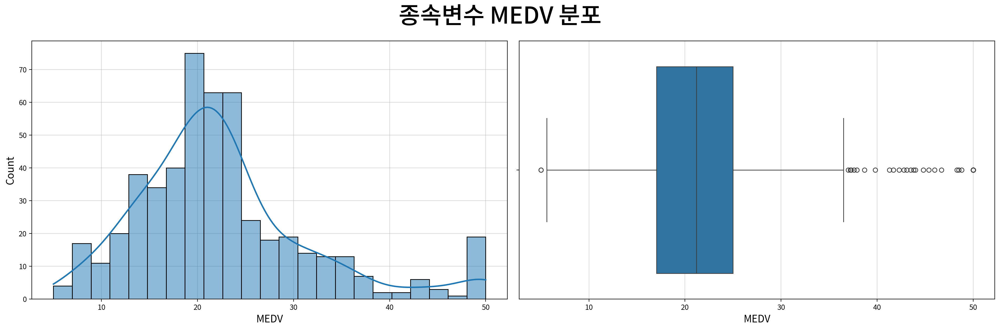

,MEDV
count,506.000
mean,22.533
std,9.197
min,5.000
25%,17.025
50%,21.200
75%,25.000
max,50.000
rel_diff,0.063
rdiff_flag,similar


In [42]:
# 1행 2열 서브플롯 구성
# -> 그래프 크기는 서브플롯 중 하나의 크기(전체 크기는 가로 960 x 2가 됨)
fig, ax = my_plot.init(rows=1, cols=2, 
            title=f"종속변수 {target} 분포", width=960, height=640)
my_plot.histplot(data=df, x=target, kde=True, ax=ax[0])
my_plot.boxplot(data=df, x=target, ax=ax[1])
my_plot.show()

# 연속형 변수 기술통계량에서 종속변수에 대한 부분만 추출
desc[desc.index == target].T

##### 결과 해석

| 점검 항목 | `MEDV` 관찰 내용 |
|---|---|
| 분포 모양(왜도) | 오른쪽으로 치우침(우편향, skew ≈ 1.1) |
| 봉우리 수 | 단봉 — 단, 오른쪽 끝(50)에 인위적 군집 |
| 이상치 | 위쪽 수염 밖에 점 존재(상위 약 8%) |
| 이산점(군집) | 50에 값이 뭉침 = 상한 처리(천장효과) |

**판단·조치**: 우편향 + 50 천장효과가 있어 그대로 쓰기엔 부담스럽다. → **로그 변환**으로 분포를 좌우 대칭에 가깝게 펴고, 50에 잘린 값(천장효과)은 높은 가격대 예측의 한계로 인지한다.

### 독립변수의 단변량 분석

#### 1. 연속형 독립변수

- 각 변수를 **분포 모양(왜도) · 봉우리 수 · 이상치(박스플롯 점) · 이산점(군집)** 관점에서 점검하여 "그대로 검정/모델에 넣어도 되는가?"를 판단한다.

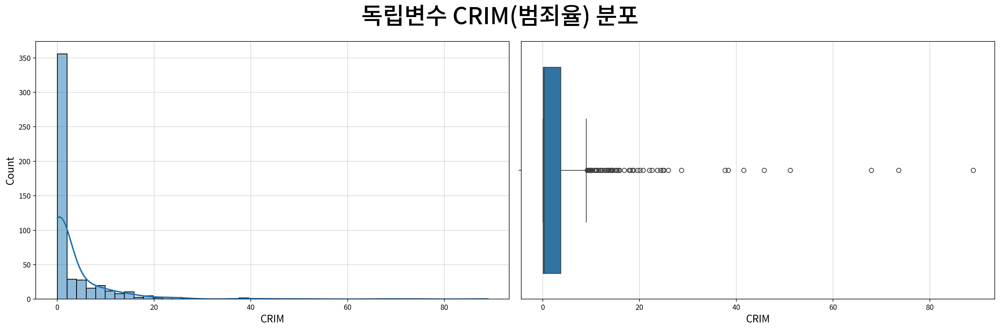

,CRIM
count,506.000
mean,3.614
std,8.602
min,0.006
25%,0.082
50%,0.257
75%,3.677
max,88.976
rel_diff,13.087
rdiff_flag,large_diff


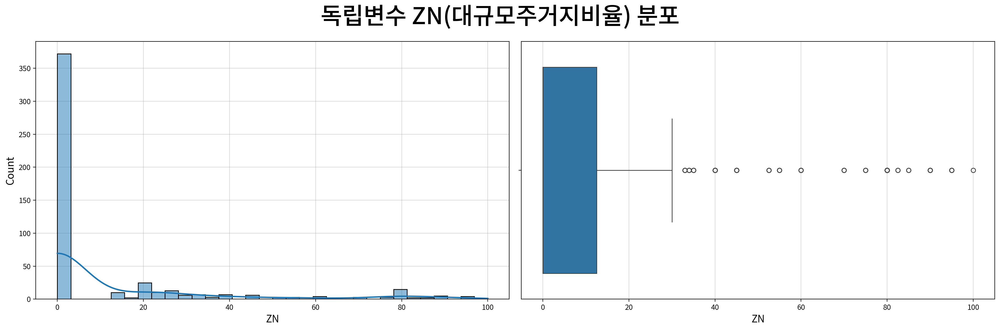

,ZN
count,506.000
mean,11.364
std,23.322
min,0.000
25%,0.000
50%,0.000
75%,12.500
max,100.000
rel_diff,inf
rdiff_flag,large_diff


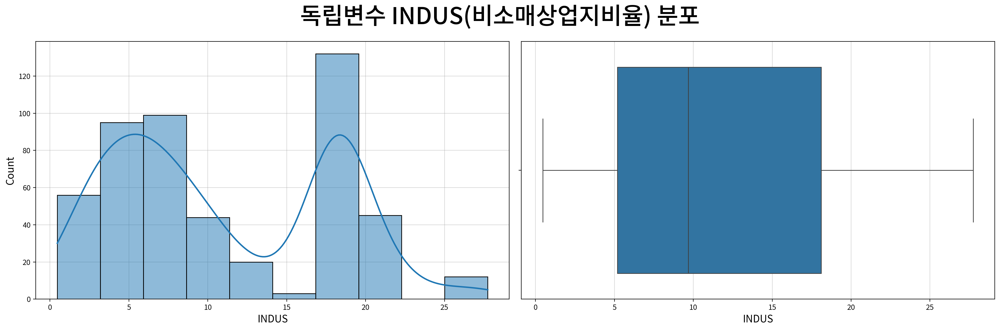

,INDUS
count,506.000
mean,11.137
std,6.860
min,0.460
25%,5.190
50%,9.690
75%,18.100
max,27.740
rel_diff,0.149
rdiff_flag,diff


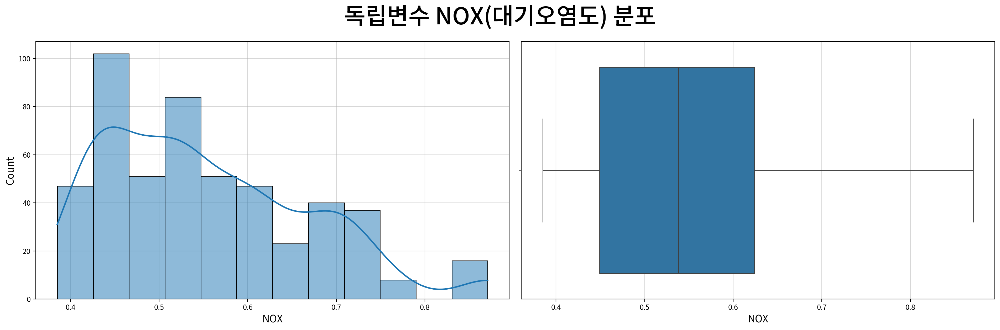

,NOX
count,506.000
mean,0.555
std,0.116
min,0.385
25%,0.449
50%,0.538
75%,0.624
max,0.871
rel_diff,0.031
rdiff_flag,similar


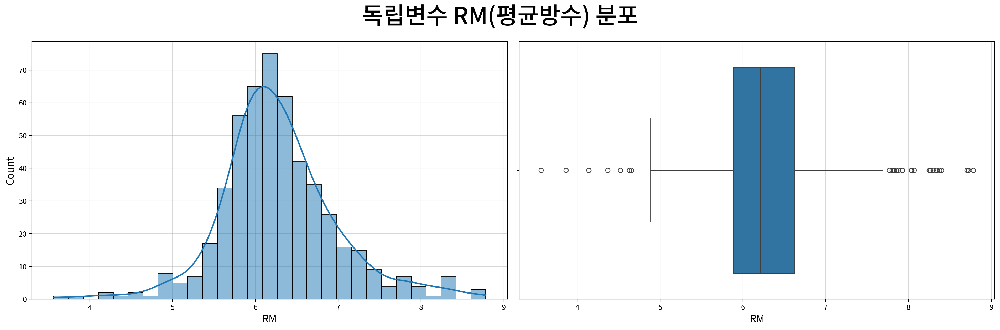

,RM
count,506.000
mean,6.285
std,0.703
min,3.561
25%,5.885
50%,6.208
75%,6.623
max,8.780
rel_diff,0.012
rdiff_flag,similar


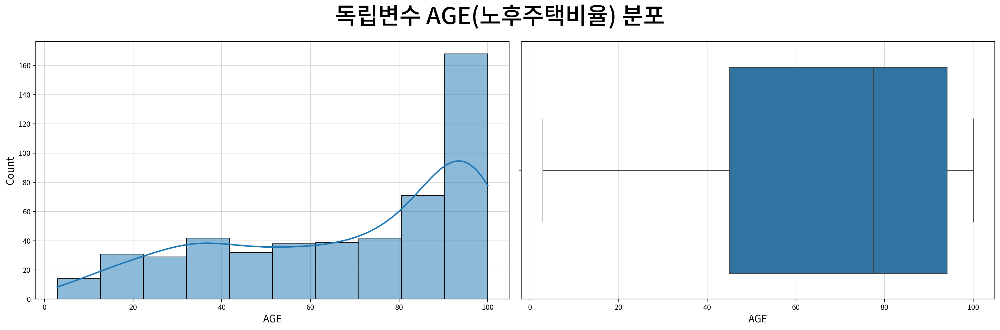

,AGE
count,506.000
mean,68.575
std,28.149
min,2.900
25%,45.025
50%,77.500
75%,94.075
max,100.000
rel_diff,0.115
rdiff_flag,diff


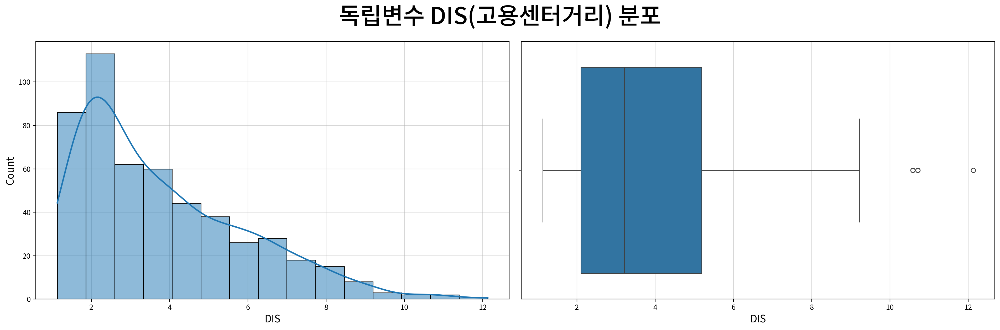

,DIS
count,506.000
mean,3.795
std,2.106
min,1.130
25%,2.100
50%,3.207
75%,5.188
max,12.127
rel_diff,0.183
rdiff_flag,diff


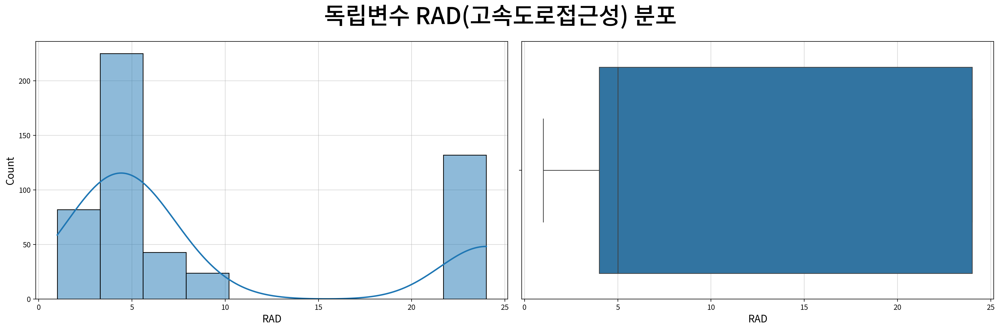

,RAD
count,506.000
mean,9.549
std,8.707
min,1.000
25%,4.000
50%,5.000
75%,24.000
max,24.000
rel_diff,0.910
rdiff_flag,large_diff


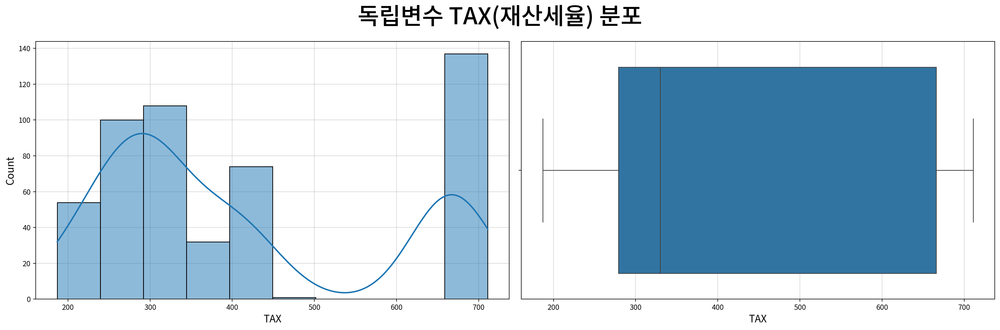

,TAX
count,506.000
mean,408.237
std,168.537
min,187.000
25%,279.000
50%,330.000
75%,666.000
max,711.000
rel_diff,0.237
rdiff_flag,diff


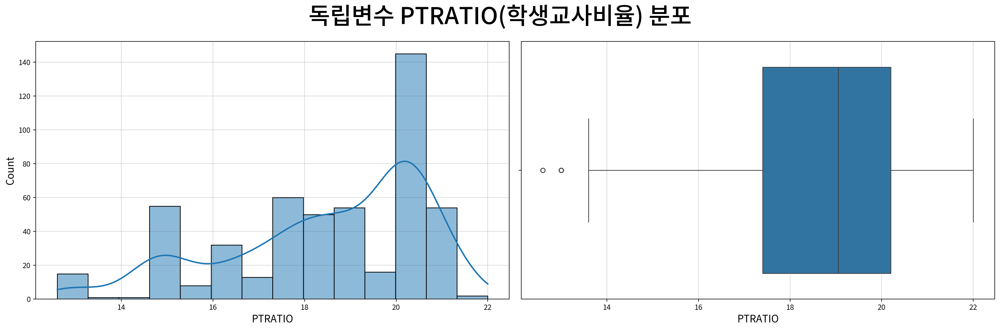

,PTRATIO
count,506.000
mean,18.456
std,2.165
min,12.600
25%,17.400
50%,19.050
75%,20.200
max,22.000
rel_diff,0.031
rdiff_flag,similar


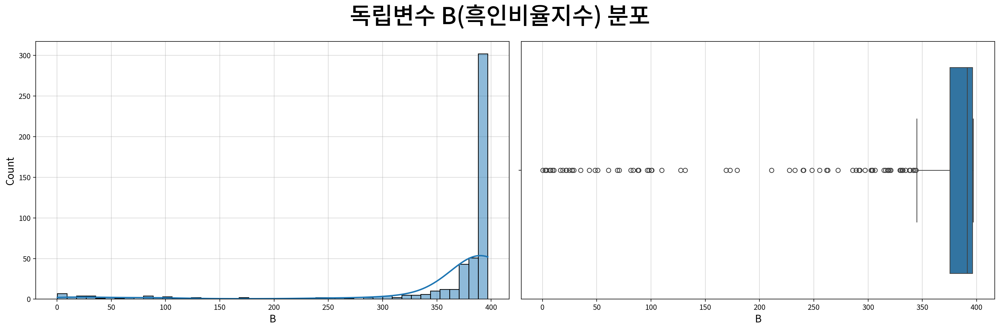

,B
count,506.000
mean,356.674
std,91.295
min,0.320
25%,375.377
50%,391.440
75%,396.225
max,396.900
rel_diff,0.089
rdiff_flag,similar


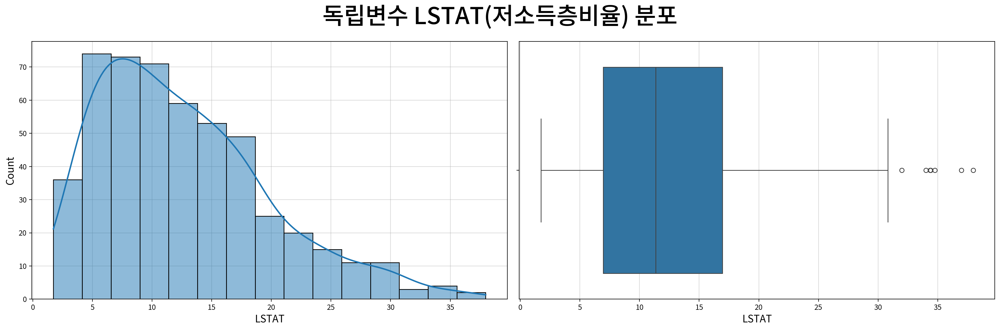

,LSTAT
count,506.000
mean,12.653
std,7.141
min,1.730
25%,6.950
50%,11.360
75%,16.955
max,37.970
rel_diff,0.114
rdiff_flag,diff


In [43]:
for f in continuous_cols:
    fig, ax = my_plot.init(rows=1, cols=2, width=960, height=640,
                title=f"독립변수 {f}({column_means[f]}) 분포")
    my_plot.histplot(data=df, x=f, kde=True, ax=ax[0])
    my_plot.boxplot(data=df, x=f, ax=ax[1])
    my_plot.show()

    display(desc[desc.index == f].T)

##### 결과 해석

| 변수 | 분포 모양(왜도) | 봉우리 | 이상치 | 이산점·군집 | 판단·조치 |
|---|---|---|---|---|---|
| `CRIM` | 매우 강한 우편향 | 단봉(0 근처 집중) | 많음(약 13%) | 0 근처의 작은 양수에 집중 | 로그 변환 + 이상치 처리 |
| `ZN` | 강한 우편향 | 0에 큰 덩어리 | 많음(약 13%) | 0에 372개 지역 집중 | log1p 변환 비교 |
| `INDUS` | 대칭에 가까움 | 다봉(쌍봉 경향) | 거의 없음 | 특정 구간 군집 | 변환 불필요, 다봉만 유의 |
| `NOX` | 약한 우편향 | 다봉 경향 | 없음 | — | 그대로 사용 가능 |
| `RM` | 대칭(정규에 가까움) | 단봉 | 양쪽에 소수 | — | 그대로 사용 가능 |
| `AGE` | 좌편향 | 단봉(100 쪽 몰림) | 없음 | 100 부근 집중 | 그대로 사용 가능 |
| `DIS` | 우편향 | 단봉 | 소수 | — | 로그 변환 고려 |
| `RAD` | 우편향 | **뚜렷한 이봉** | 없음 | **24에 큰 군집** | 사실상 범주형 → 선형 가정 주의 |
| `TAX` | 우편향 | **이봉** | 없음 | **666~711에 군집** | 사실상 범주형 → 선형 가정 주의 |
| `PTRATIO` | 좌편향 | 다봉(값 군집) | 소수 | 특정 값에 집중 | 그대로 사용 가능 |
| `B` | 매우 강한 좌편향 | 단봉(396 쪽 몰림) | 많음(약 15%) | 396 부근 집중 | 반사 후 log1p 변환 비교 |
| `LSTAT` | 우편향 | 단봉 | 소수 | — | 로그 변환 고려 |

#### 2. 명목형 독립변수

- 명목형은 분포 모양·왜도 대신 **범주의 균형/불균형**을 점검하여 "그대로 검정/모델에 넣어도 되는가?"를 판단한다.

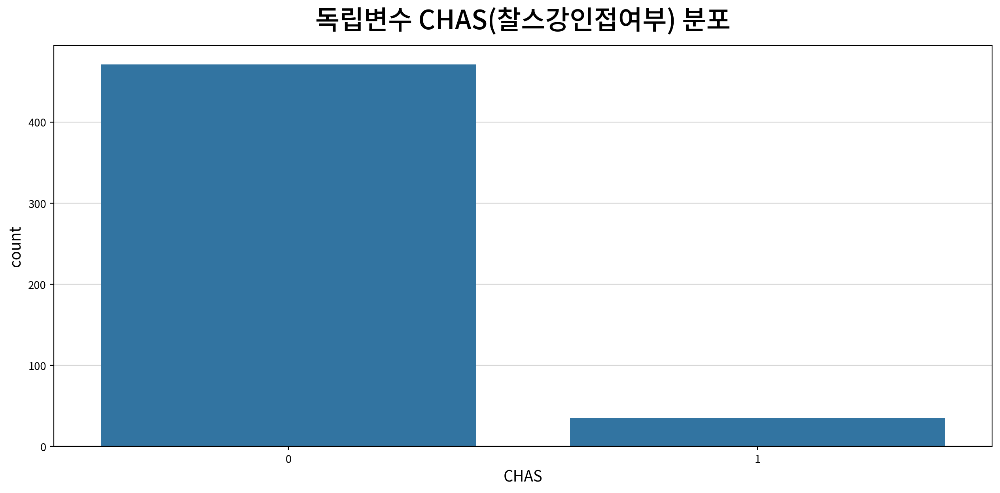

,count,unique,top,freq
CHAS,506,2,0,471


,빈도,비율
CHAS,,
0,471,0.931
1,35,0.069


In [44]:
for n in nominal_cols:
    # 명목형 분포는 카운트 플롯으로 처리한다.
    my_plot.countplot(data=df, x=n, title=f"독립변수 {n}({column_means[n]}) 분포")

    # 명목형 기술통계량
    display(cat_desc[[n]].T)

    # 추가적으로 빈도표 생성
    freq = df[n].value_counts().rename("빈도").to_frame()
    # value_counts(normalize=True)
    # --> 전체 고유값의 개수(빈도수) 대신 전체 데이터의 비율을 계산
    freq["비율"] = df[n].value_counts(normalize=True)
    display(freq)

##### CHAS 집단 비교의 의미

CHAS=1은 35개, CHAS=0은 471개 지역이다. 강변 인접 여부와 MEDV의 관계는 두 집단 차이 검정으로 검토했으며, 실제 선택된 검정은 정규성 점검을 반영한 **Mann–Whitney U**였다. 양측 p≈0.002와 분포 방향은 강변 인접 집단 쪽 가격이 높은 관계를 지지했다.

이는 다른 특성을 통제하지 않은 집단 비교다. 소수 집단이 있다는 이유만으로 효과를 무시하지도, 유의하다는 이유만으로 보편적 프리미엄을 확정하지도 않는다. 회귀에서도 양의 조건부 계수가 남았지만 관찰자료의 관계이며 인과효과는 아니다.

<a id="bivariate"></a>

## 2-2. 이변량 분석

### 준비작업

### 앞 절의 분석 설정 재사용

동일 노트북 앞 절에서 불러온 데이터와 변수 유형 설정을 사용한다.

#### 2. 불러온 내용 확인

- 이전 분석 내역이 잘 로드 되었는지 확인한다.

In [45]:
print("종속변수 :", target)
print("종속변수 유형: " + ("연속형" if target_is_continuous else "명목형"))
print("연속형   :", continuous_cols)
print("명목형   :", nominal_cols)

display(df.head())
display(desc.head())
display(cat_desc.head())

종속변수 : MEDV
종속변수 유형: 연속형
연속형   : ['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT']
명목형   : ['CHAS']


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


,count,mean,std,min,25%,50%,75%,max,rel_diff,rdiff_flag,iqr,upper_bound,lower_bound,upper_outliers,upper_outliers_ratio,lower_outliers,lower_outliers_ratio,outliers,outliers_ratio,skew,skew_interpret,kurt,kurt_interpret,log_need
CRIM,506.000,3.614,8.602,0.006,0.082,0.257,3.677,88.976,13.087,large_diff,3.595,9.070,-5.311,66,0.130,0,0.000,66,0.130,5.223,right tail,37.131,leptokurtic,log
ZN,506.000,11.364,23.322,0.000,0.000,0.000,12.500,100.000,inf,large_diff,12.500,31.250,-18.750,68,0.134,0,0.000,68,0.134,2.226,right tail,4.032,leptokurtic,log1p
INDUS,506.000,11.137,6.860,0.460,5.190,9.690,18.100,27.740,0.149,diff,12.910,37.465,-14.175,0,0.000,0,0.000,0,0.000,0.295,symmetric,-1.234,platykurtic,none
NOX,506.000,0.555,0.116,0.385,0.449,0.538,0.624,0.871,0.031,similar,0.175,0.886,0.187,0,0.000,0,0.000,0,0.000,0.729,right tail,-0.065,platykurtic,none
RM,506.000,6.285,0.703,3.561,5.885,6.208,6.623,8.780,0.012,similar,0.738,7.731,4.778,22,0.043,8,0.016,30,0.059,0.404,symmetric,1.892,leptokurtic,none


,CHAS
count,506
unique,2
top,0
freq,471


#### 3. 라이브러리 참조

- display는 ipynb에서 사용할 수 있는 전용 출력 함수
- Markdown은 ipynb의 출력 내용에 마크다운을 사용할 수 있게 한다.

In [46]:
from IPython.display import display, Markdown

### 이변량 분석

#### 1. 상관분석 (x: 연속형 독립변수 → y: 연속형 종속변수)

- **연속형 독립(설명)변수와 종속변수(`MEDV`)의 관계 방향·모양**을 **산점도**로 확인한다.
- 관계의 **방향(증가/감소)·모양(선형/곡선)·산포·이상치**를 동시에 확인

#### ▶︎ CRIM(범죄율) → MEDV

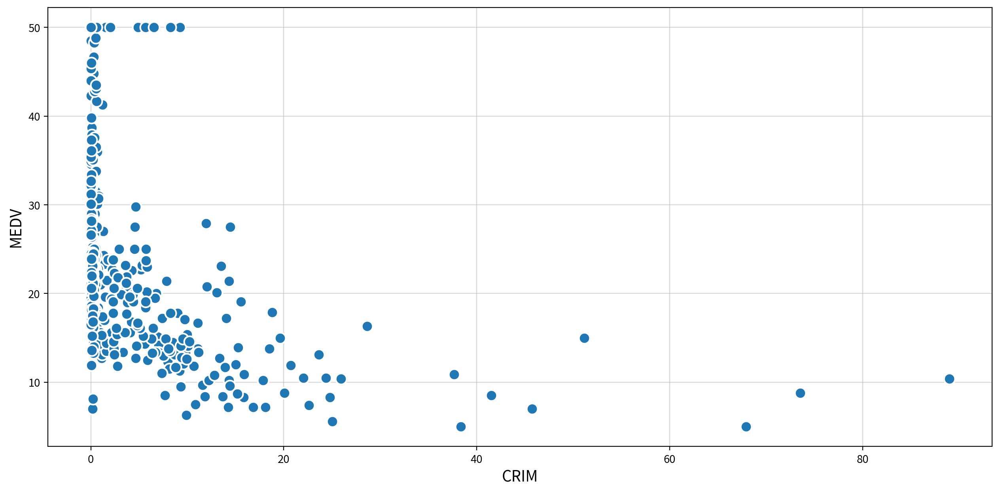

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
CRIM,MEDV,Spearman,-0.559,0.000,Moderate,True,False,False,False,False,True


#### ▶︎ ZN(대규모주거지비율) → MEDV

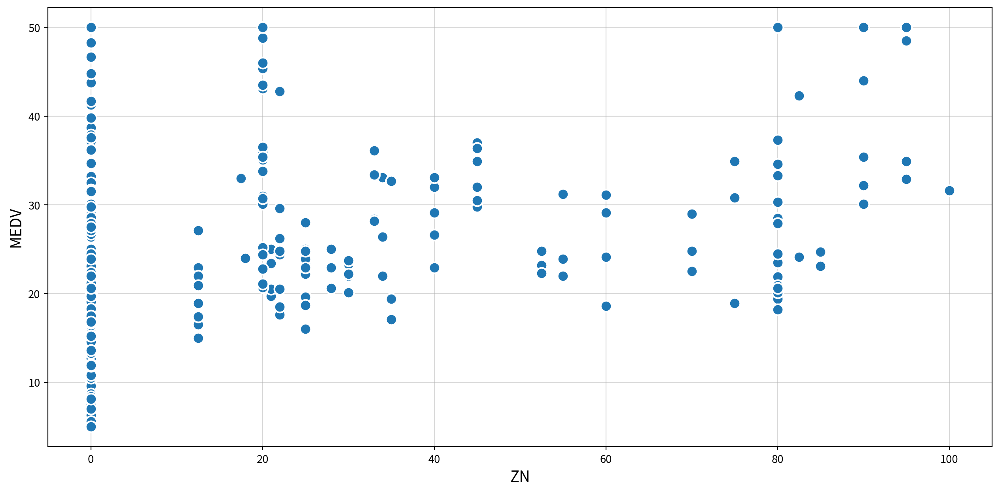

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
ZN,MEDV,Spearman,0.438,0.000,Moderate,True,False,False,False,False,True


#### ▶︎ INDUS(비소매상업지비율) → MEDV

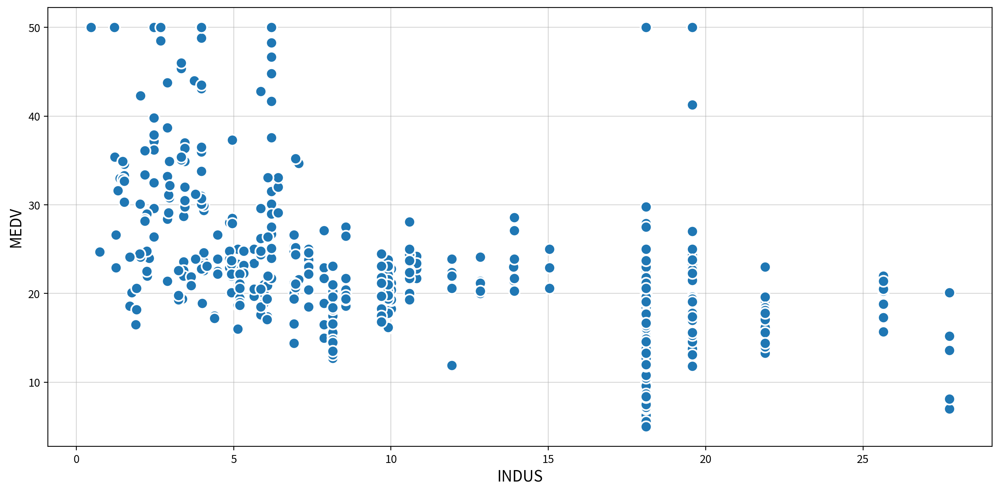

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
INDUS,MEDV,Spearman,-0.578,0.000,Moderate,True,False,False,False,True,True


#### ▶︎ NOX(대기오염도) → MEDV

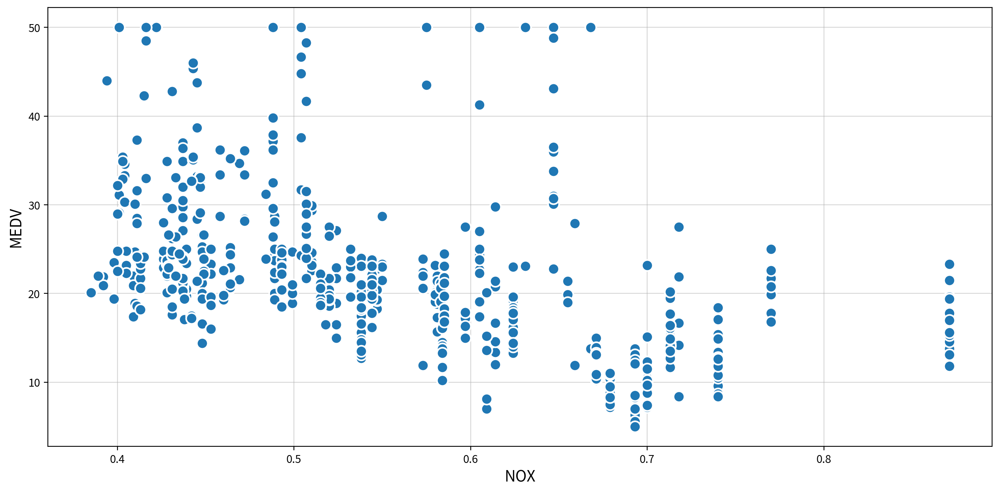

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
NOX,MEDV,Spearman,-0.563,0.000,Moderate,True,False,False,True,True,True


#### ▶︎ RM(평균방수) → MEDV

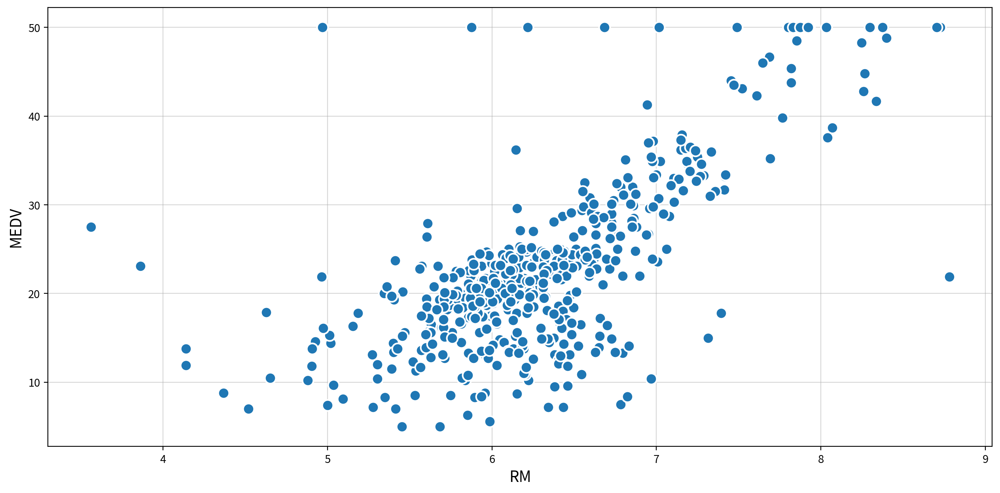

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
RM,MEDV,Spearman,0.634,0.000,Moderate,True,False,False,False,False,True


#### ▶︎ AGE(노후주택비율) → MEDV

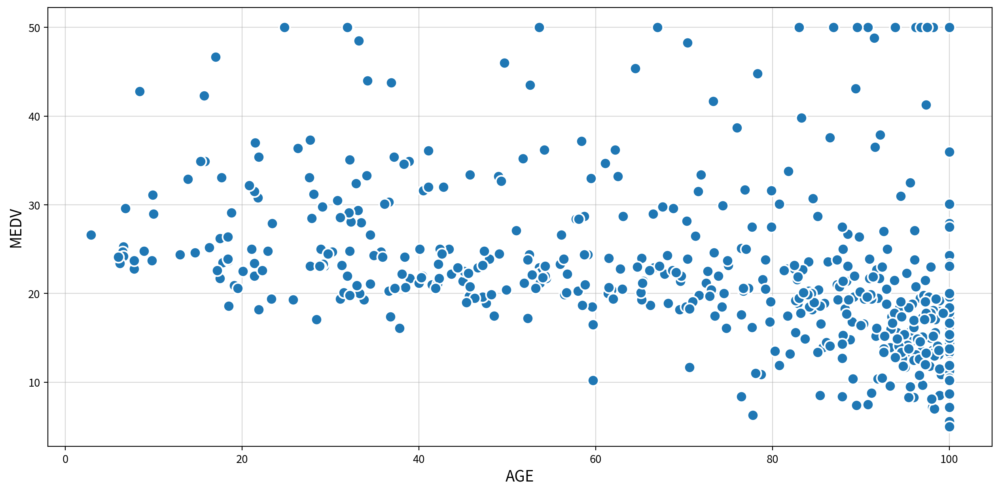

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
AGE,MEDV,Spearman,-0.548,0.000,Moderate,True,False,False,False,True,True


#### ▶︎ DIS(고용센터거리) → MEDV

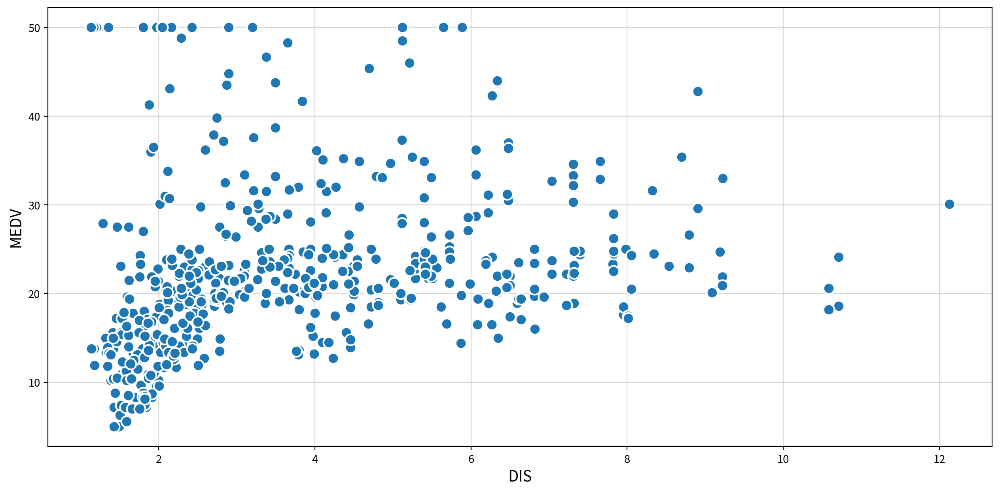

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
DIS,MEDV,Spearman,0.446,0.000,Moderate,True,False,False,False,True,True


#### ▶︎ RAD(고속도로접근성) → MEDV

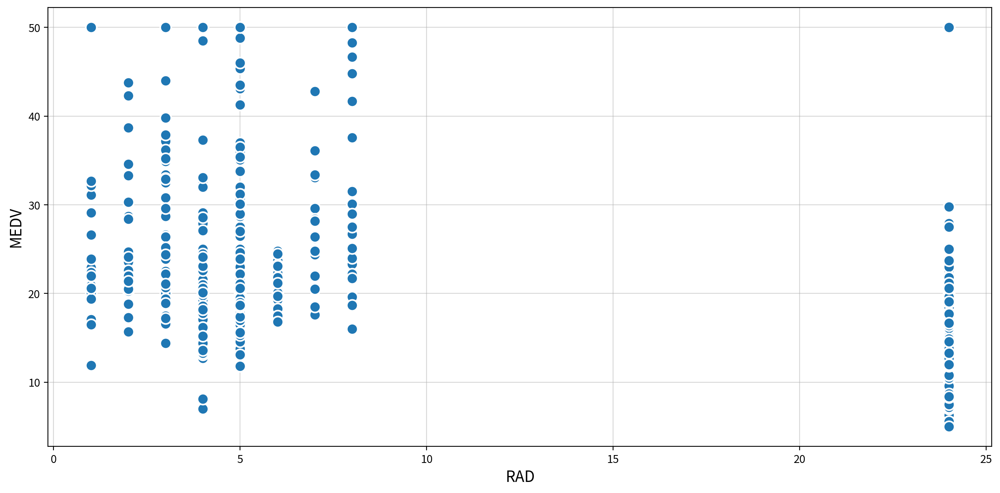

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
RAD,MEDV,Spearman,-0.347,0.000,Moderate,True,False,False,False,True,True


#### ▶︎ TAX(재산세율) → MEDV

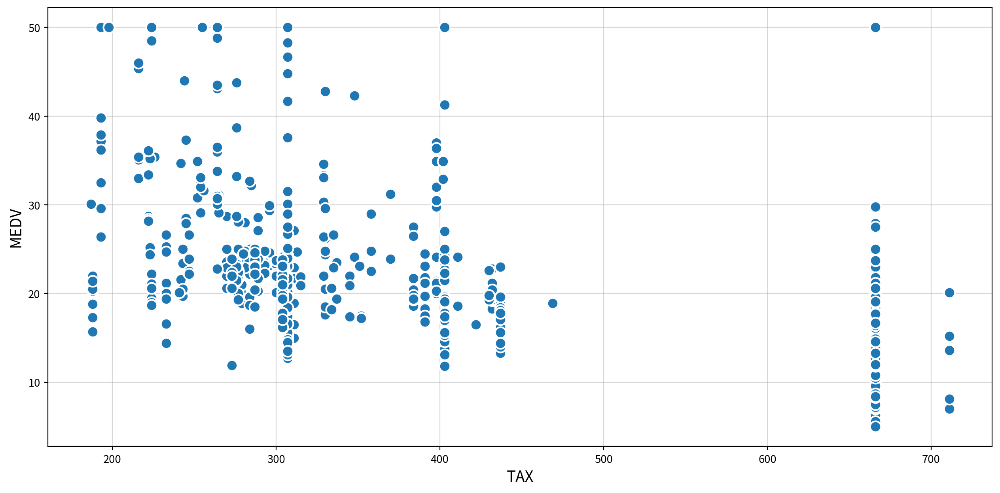

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
TAX,MEDV,Spearman,-0.562,0.000,Moderate,True,False,False,True,True,True


#### ▶︎ PTRATIO(학생교사비율) → MEDV

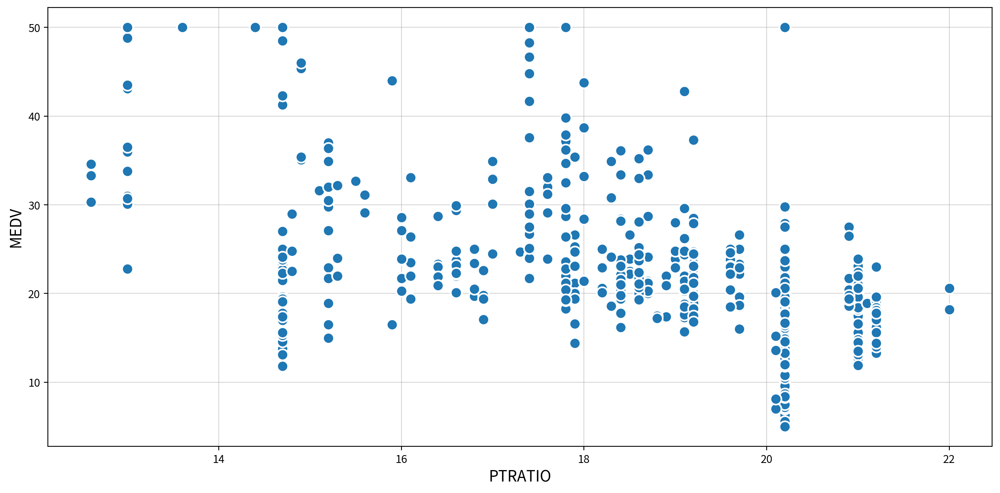

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
PTRATIO,MEDV,Spearman,-0.556,0.000,Moderate,True,False,False,True,False,True


#### ▶︎ B(흑인비율지수) → MEDV

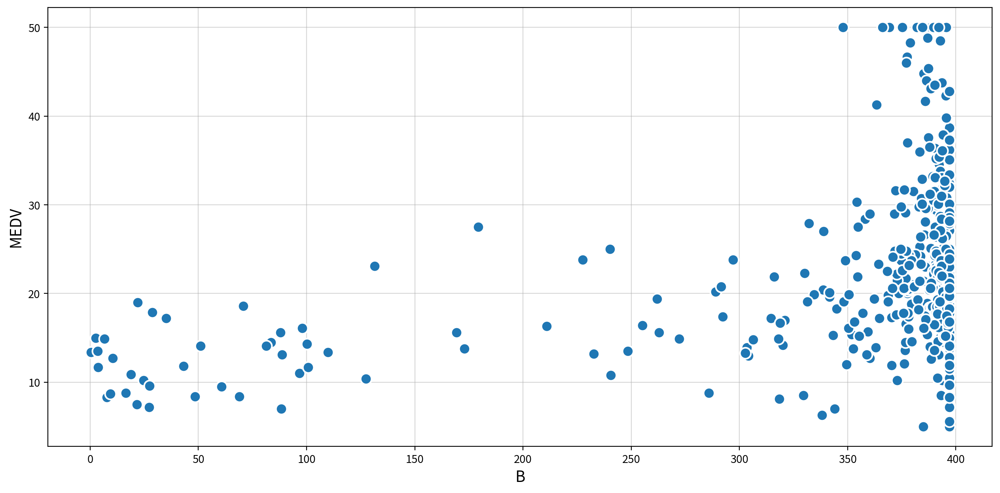

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
B,MEDV,Spearman,0.186,0.000,Weak,True,False,False,True,True,True


#### ▶︎ LSTAT(저소득층비율) → MEDV

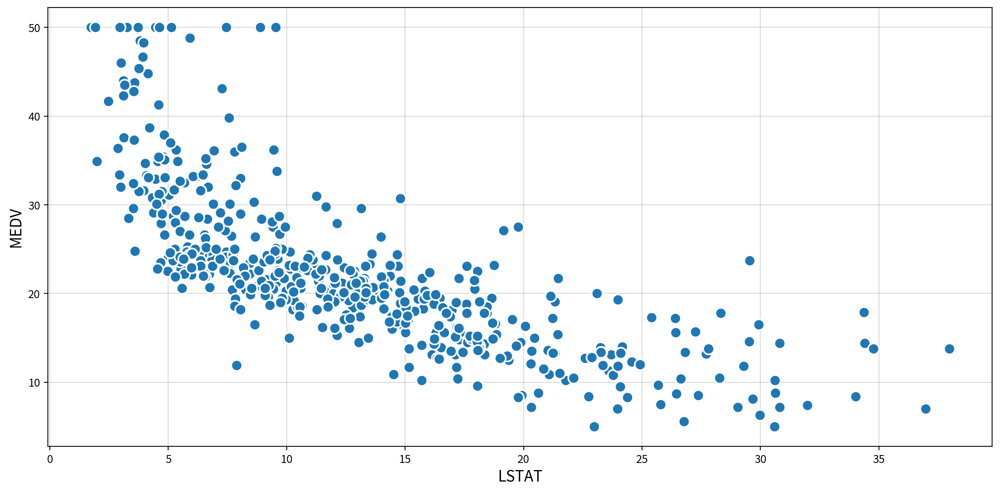

,,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,y,,,,,,,,,,
LSTAT,MEDV,Spearman,-0.853,0.000,Strong,True,False,False,False,False,True


In [47]:
# 연속형 독립변수 이름을 탐색하면서 반복
for f in continuous_cols:
    # 빈 줄 출력용
    print()

    # 분석 단위 제목 출력
    display(Markdown(f"#### ▶︎ {f}({column_means[f]}) → {target}"))
    
    # my_stats는 시각화까지 일괄처리 한다.
    display(my_stats.correlation(df, x=f, y=target))

##### 결과 해석 (그래프별 정리)

> ⚠️ **채택 여부는 이 셀의 "개별 독립변수 ↔ 종속변수(`MEDV`) 단독 관계"만 기준**으로 판단한다.
> 상관계수(ρ)·강도·유의성은 위 검정 결과표에서 인용했다. **변수 간 다중공선성은 여기서 고려하지 않으며, 이후 회귀 진단(VIF)에서 별도로 점검한다.**

**`CRIM` → `MEDV`** — 범죄율

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | 음의 관계이나 **비선형**(낮은 CRIM에 몰리고 급격히 하락) |
| 단조성 | CRIM↑ → MEDV↓ 로 대체로 단조 감소 |
| 산포 | CRIM 대부분 0 근처에 밀집, 고 CRIM 구간은 저가로 수렴 |
| 이상치 | **고 CRIM 우측 꼬리** 극단값 다수(우왜곡) |
| **채택 여부** | **채택** — 유의한 음의 중간 상관(Spearman ρ=-0.559, Moderate) |

**`ZN` → `MEDV`** — 대형 주거지 비율

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | **`ZN=0` 세로열(약 372건)** 이 지배적, 0 초과에서 약한 양의 경향 |
| 단조성 | 방향은 양(+), **Spearman ρ=0.438로 중간 수준 단조 증가**(0 밀집에도 순위상 관계는 뚜렷) |
| 산포 | 0열의 세로 산포 큼, 값이 클수록 표본 희박 |
| 이상치 | 우왜곡, 고 ZN 소수 표본 |
| **채택 여부** | **채택** — 유의한 양의 중간 상관(Spearman ρ=0.438, Moderate) |

**`INDUS` → `MEDV`** — 비소매 상업지 비율

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | 음의 관계, **`INDUS`≈18 부근에 값이 뭉치는 이봉 구조** |
| 단조성 | INDUS↑ → MEDV↓ 완만한 감소 |
| 산포 | 군집별로 세로 산포, 절단 밴드와 겹침 |
| 이상치 | 뚜렷한 개별 이상치는 적음 |
| **채택 여부** | **채택** — 유의한 음의 중간 상관(Spearman ρ=-0.578, Moderate) |

**`NOX` → `MEDV`** — 질소산화물 농도

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | 음의 관계, **비선형**(고농도에서 저가 집중) |
| 단조성 | NOX↑ → MEDV↓ 경향 |
| 산포 | 전 구간 산포 큼 |
| 이상치 | 개별 이상치보다 고 NOX 저가 군집 |
| **채택 여부** | **채택** — 유의한 음의 중간 상관(Spearman ρ=-0.563, Moderate) |

**`RM` → `MEDV`** — 평균 방 개수

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | 뚜렷한 양의 관계(눈으로는 준선형이나, **RESET·자동 검정상 Spearman 선택** = 완전한 선형 가정은 미충족) |
| 단조성 | RM↑ → MEDV↑ 강한 단조 증가 |
| 산포 | 중앙 구간은 좁고 고 RM에서 확대 |
| 이상치 | 저 RM 저가·고 RM 고가 양끝 이상치, 상단 50 절단 밴드 |
| **채택 여부** | **채택** — 유의한 양의 중간 상관(Spearman ρ=0.634, Moderate; 양의 관계 중 최강) |

**`AGE` → `MEDV`** — 1940년 이전 건축 비율

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | 음의 관계, 고 AGE로 갈수록 하락 가속(**비선형**) |
| 단조성 | AGE↑ → MEDV↓ 경향 |
| 산포 | 저·중 AGE 구간 산포 큼 |
| 이상치 | 좌왜곡, 노후 비율 높은 쪽에 저가 집중 |
| **채택 여부** | **채택** — 유의한 음의 중간 상관(Spearman ρ=-0.548, Moderate) |

**`DIS` → `MEDV`** — 고용센터까지 거리

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | 전체 약한 양이나 **곡선형 비선형**(근거리 저가 다수) |
| 단조성 | 대체로 DIS↑ → MEDV↑ (단조 증가 곡선) |
| 산포 | 근거리에서 산포 매우 큼 |
| 이상치 | 원거리 소수 고가 표본 |
| **채택 여부** | **채택** — 유의한 양의 중간 상관(Spearman ρ=0.446, Moderate) |

**`RAD` → `MEDV`** — 고속도로 접근성 지수

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | **이산값**, `RAD=24`에 132건 대군집 → 두 덩어리로 분리 |
| 단조성 | RAD↑ → MEDV↓ 방향, **Spearman ρ=-0.347로 중간(경계) 단조 관계**(이산·군집에도 순위상 관계 존재) |
| 산포 | `RAD=24` 그룹이 저가에 집중 |
| 이상치 | `RAD=24` 군집 자체가 별도 층 |
| **채택 여부** | **채택(경계)** — 유의하나 Spearman ρ=-0.347로 Weak 경계에 근접, 단독 설명력은 최하위권 |

**`TAX` → `MEDV`** — 재산세율

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | 음의 관계, **`TAX`≈666에 132건 군집**(RAD=24와 동일 집단) → 이봉 |
| 단조성 | TAX↑ → MEDV↓ 경향 |
| 산포 | 고세율 군집이 저가로 뭉침 |
| 이상치 | 고세율 덩어리가 별도 층 형성 |
| **채택 여부** | **채택** — 유의한 음의 중간 상관(Spearman ρ=-0.562, Moderate) |

**`PTRATIO` → `MEDV`** — 학생/교사 비율

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | 음의 관계, 값이 **계단형(이산적)** 으로 뭉침 |
| 단조성 | PTRATIO↑ → MEDV↓ |
| 산포 | 특정 비율 값에 세로열 형성 |
| 이상치 | 소수 상단 이상치 |
| **채택 여부** | **채택** — 유의한 음의 중간 상관(Spearman ρ=-0.556, Moderate) |

**`B` → `MEDV`** — 흑인 비율 지표

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | **대부분 396 근처에 몰림**(좌왜곡), 약한 양이나 **비단조** |
| 단조성 | 전반적 방향성 약함 |
| 산포 | 우측 밀집·좌측 넓게 퍼짐 |
| 이상치 | **좌측 저 B 이상치 다수(약 15%)** |
| **채택 여부** | **보류** — 유의하나 Spearman ρ=0.186(**Weak**), 단독 설명력이 미미하여 우선 제외 후보 |

**`LSTAT` → `MEDV`** — 저소득층 비율

| 확인 항목 | 관찰 내용 |
|---|---|
| 선형/비선형 | **가장 강한 음의 관계 + 뚜렷한 볼록 곡선(비선형)** |
| 단조성 | LSTAT↑ → MEDV↓ 강한 단조 감소(급감 후 완만) |
| 산포 | 저 LSTAT에서 산포 크고 고 LSTAT에서 저가 수렴 |
| 이상치 | 곡선 위쪽 소수 이상치, 상단 절단 밴드 |
| **채택 여부** | **채택(최우선)** — 유의한 음의 **강한** 상관(Spearman ρ=-0.853, **Strong**; 전 변수 중 최강) |


- **공통**: 종속변수 `MEDV`가 **50에서 상한 절단(16건)** 되어 모든 산점도 상단에 수평 밴드가 나타난다. 또한 `MEDV`의 왜도(≈1.11)가 커서 **모든 쌍에서 Spearman이 자동 선택**되었다(Pearson으로 산출된 변수 없음).
- **채택 결론(x–y 단독 관계 기준, 공선성 미고려)**:
  - **채택**: `LSTAT`(Strong, 최우선) · `RM` · `INDUS` · `NOX` · `TAX` · `CRIM` · `PTRATIO` · `AGE` · `DIS` · `ZN` · `RAD`(경계) — 모두 유의하며 ρ가 Moderate 이상.
  - **보류**: `B` — 유의하나 Weak(ρ=0.186)로 단독 설명력 미미.
  - ⚠️ 여기서는 각 변수의 `MEDV` 단독 설명력만 본 것이며, **채택군 내부의 중복(다중공선성)은 이후 회귀 진단(VIF)에서 최종 선별**한다.

#### 2. T-Test (x: 2집단 명목형 독립변수 → y: 종속변수)

- 명목형과 `MEDV`의 그룹 차이를 박스 플롯으로 확인한다

#### ▶︎ CHAS(찰스강인접여부) → MEDV

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0 vs. 1: Mann-Whitney-Wilcoxon test two-sided, P_val:1.582e-03 U_stat=5.606e+03


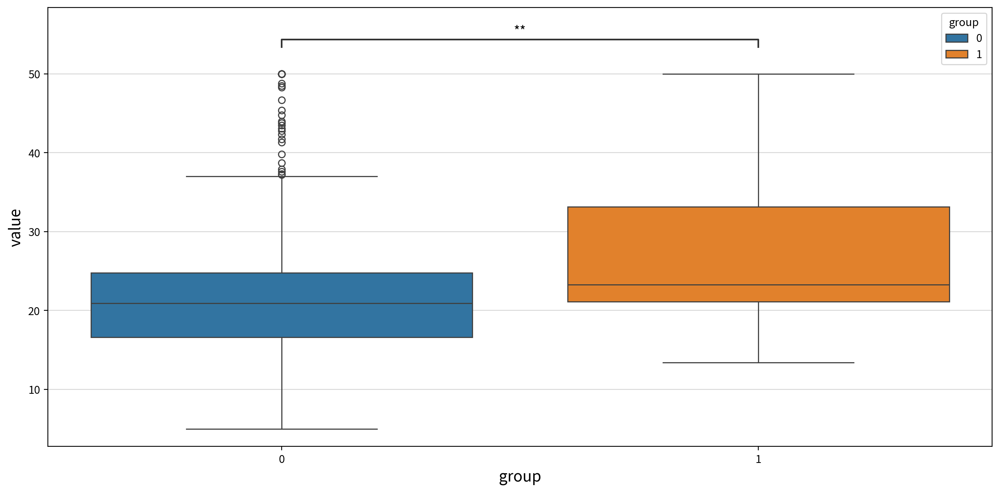

statistic  p-value  significant  result
test                alternative                                         
Mann-Whitney U test two-sided     5605.500    0.002         True  0 != 1
                    less          5605.500    0.001         True   0 < 1
                    greater       5605.500    0.999        False  0 <= 1

In [48]:
for n in nominal_cols:
    # 빈 줄 출력용
    print()

    # 분석 단위 제목 출력
    display(Markdown(f"#### ▶︎ {n}({column_means[n]}) → {target}"))

    # 수집된 데이터가 long 타입이므로 검정 대상만 wide 타입으로 변환해야 한다.
    wide_df = my_prep.long2wide(origin, hue=n, values=target)
    display(my_stats.test_independent(wide_df, 
                group1=wide_df.columns[0], group2=wide_df.columns[1]))

##### 결과 해석 (검정 결과표 기준)

**`CHAS` → `MEDV` (명목 2집단)** — 집단 라벨 0, 1

| 확인 항목 | 관찰 내용 |
|---|---|
| 적용된 검정 | 정규성 미충족으로 T검정이 아니라 **Mann-Whitney U(비모수)가 채택**됨 (통계량 5605.5) |
| 양측 검정 | **`0 ≠ 1`(p<0.05)** → 두 집단의 `MEDV` 분포에 차이가 있음 |
| 단측 검정 | **`0 < 1`(p<0.05), `0 > 1` (p≥0.05)** → 집단 1의 `MEDV`가 집단 0보다 큼 |
| **채택 여부** | **채택** — 두 집단 간 차이가 유의함 |

자동 검정표의 result 열에서 `=` 또는 `<=`로 표시되는 비유의 결과는 귀무가설의 비기각을 단순화한 표기다. 집단이 같거나 특정 부등식이 입증됐다는 뜻으로 사용하지 않고, 대립가설·p값·효과 방향을 함께 읽는다.

### 변수 채택 결과 표

- **채택 기준은 "각 독립변수 ↔ 종속변수(`MEDV`) 단독 관계"만 사용한다.**
  - 연속형: 유의 + |ρ|≥0.3, 명목형: 집단 차이 유의
- 공선성(변수 간 중복)은 이 이변량 단계에서는 알 수 없다.

| 채택여부 | 변수 | 검정방법 | 유의수준 (p) | 효과크기 | 가정점검 | 비대칭신호 | 근거 |
|---|---|---|---|---|---|---|---|
| ✅ 채택 | LSTAT | Spearman | $< 0.05$ | ρ=-0.853 (강함) | 정규성 위배 / 선형성 위배 / 이상치 계수왜곡 없음 | 우편향 / 로그변환 후보(실제 변환은 전처리 표 확인) | 유의미한 상관 (\|coef\|≥0.3, 최강) |
| ✅ 채택 | RM | Spearman | $< 0.05$ | ρ=+0.634 (중간) | 정규성 위배 / 선형성 위배 / 이상치 계수왜곡 없음 | 대칭 / 불필요 | 유의미한 상관 (\|coef\|≥0.3) |
| ✅ 채택 | INDUS | Spearman | $< 0.05$ | ρ=-0.578 (중간) | 정규성 위배 / 선형성 위배 / 이상치 계수왜곡 있음 | 대칭 / 불필요 | 유의미한 상관 (\|coef\|≥0.3) |
| ✅ 채택 | NOX | Spearman | $< 0.05$ | ρ=-0.563 (중간) | 정규성 위배 / 선형성 비기각 / 이상치 계수왜곡 있음 | 우편향 / 불필요 | 유의미한 상관 (\|coef\|≥0.3) |
| ✅ 채택 | TAX | Spearman | $< 0.05$ | ρ=-0.562 (중간) | 정규성 위배 / 선형성 비기각 / 이상치 계수왜곡 있음 | 우편향 / 불필요 | 유의미한 상관 (\|coef\|≥0.3) |
| ✅ 채택 | CRIM | Spearman | $< 0.05$ | ρ=-0.559 (중간) | 정규성 위배 / 선형성 위배 / 이상치 계수왜곡 없음 | 우편향 / 로그변환 후보(실제 변환은 전처리 표 확인) | 유의미한 상관 (\|coef\|≥0.3) |
| ✅ 채택 | PTRATIO | Spearman | $< 0.05$ | ρ=-0.556 (중간) | 정규성 위배 / 선형성 비기각 / 이상치 계수왜곡 없음 | 좌편향 / 불필요 | 유의미한 상관 (\|coef\|≥0.3) |
| ✅ 채택 | AGE | Spearman | $< 0.05$ | ρ=-0.548 (중간) | 정규성 위배 / 선형성 위배 / 이상치 계수왜곡 있음 | 좌편향 / 불필요 | 유의미한 상관 (\|coef\|≥0.3) |
| ✅ 채택 | DIS | Spearman | $< 0.05$ | ρ=+0.446 (중간) | 정규성 위배 / 선형성 위배 / 이상치 계수왜곡 있음 | 우편향 / 로그변환 후보(실제 변환은 전처리 표 확인) | 유의미한 상관 (\|coef\|≥0.3) |
| ✅ 채택 | ZN | Spearman | $< 0.05$ | ρ=+0.438 (중간) | 정규성 위배 / 선형성 위배 / 이상치 계수왜곡 없음 | 우편향 / 로그변환 후보(실제 변환은 전처리 표 확인) | 유의미한 상관 (\|coef\|≥0.3) |
| ✅ 채택 | RAD | Spearman | $< 0.05$ | ρ=-0.347 (중간) | 정규성 위배 / 선형성 위배 / 이상치 계수왜곡 있음 | 우편향 / 로그변환 후보(실제 변환은 전처리 표 확인) | 유의미한 상관 (\|coef\|≥0.3, Weak 경계) |
| ✅ 채택 | CHAS | Mann-Whitney U test | $< 0.05$ | 미제공 | 정규성 위배 → 비모수 검정 | 해당 없음 | 집단 간 차이 유의함 (인접1 고가) |
| 🟡 보류 | B | Spearman | $< 0.05$ | ρ=+0.186 (약함) | 정규성 위배 / 선형성 비기각 / 이상치 계수왜곡 있음 | 좌편향 / 반사 후 log1p 후보 | 유의하나 관계 약함 (\|coef\|<0.3) → **모델링 투입 후 계수 유의성으로 최종 판정** |

> 이 표의 채택·보류는 탐색 의견이며 열을 삭제한 실행 내역이 아니다. 최종 변수는 회귀계수 표에서 확인한다.

<a id="multivariate"></a>

## 2-3. 다변량 분석

### 준비작업

### 앞 절의 분석 설정 재사용

동일 노트북 앞 절에서 불러온 데이터와 변수 유형 설정을 사용한다.

#### 2. 불러온 내용 확인

- 이전 분석 내역이 잘 로드 되었는지 확인한다.

In [49]:
print("종속변수 :", target)
print("종속변수 유형: " + ("연속형" if target_is_continuous else "명목형"))
print("연속형   :", continuous_cols)
print("명목형   :", nominal_cols)

display(df.head())
display(desc.head())
display(cat_desc.head())

종속변수 : MEDV
종속변수 유형: 연속형
연속형   : ['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT']
명목형   : ['CHAS']


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


,count,mean,std,min,25%,50%,75%,max,rel_diff,rdiff_flag,iqr,upper_bound,lower_bound,upper_outliers,upper_outliers_ratio,lower_outliers,lower_outliers_ratio,outliers,outliers_ratio,skew,skew_interpret,kurt,kurt_interpret,log_need
CRIM,506.000,3.614,8.602,0.006,0.082,0.257,3.677,88.976,13.087,large_diff,3.595,9.070,-5.311,66,0.130,0,0.000,66,0.130,5.223,right tail,37.131,leptokurtic,log
ZN,506.000,11.364,23.322,0.000,0.000,0.000,12.500,100.000,inf,large_diff,12.500,31.250,-18.750,68,0.134,0,0.000,68,0.134,2.226,right tail,4.032,leptokurtic,log1p
INDUS,506.000,11.137,6.860,0.460,5.190,9.690,18.100,27.740,0.149,diff,12.910,37.465,-14.175,0,0.000,0,0.000,0,0.000,0.295,symmetric,-1.234,platykurtic,none
NOX,506.000,0.555,0.116,0.385,0.449,0.538,0.624,0.871,0.031,similar,0.175,0.886,0.187,0,0.000,0,0.000,0,0.000,0.729,right tail,-0.065,platykurtic,none
RM,506.000,6.285,0.703,3.561,5.885,6.208,6.623,8.780,0.012,similar,0.738,7.731,4.778,22,0.043,8,0.016,30,0.059,0.404,symmetric,1.892,leptokurtic,none


,CHAS
count,506
unique,2
top,0
freq,471


#### 3. 라이브러리 참조

In [50]:
from IPython.display import display, Markdown
from pandas import concat, merge
import numpy as np

### 연속형 변수간의 다변량 분석

#### 1. 독립변수간 상관 분석

- 각 독립변수와 종속변수간의 상관 분석은 이미 진행된 상태이므로 종속변수를 포함하지 않는다.
  - 다중공선성 신호를 감지하기 위해 사용한다.
- 모델링용 전처리 과정에서 VIF값을 통한 필터링이 진행되므로 사실상 생략해도 무관하다.
- 시각화 결과물이 복잡하고 해석이 어렵기 때문에 PairPlot은 잘 사용하지 않는다.
  - `plot=False` 파라미터 적용 (여기서는 경험을 위해 사용함)

In [51]:
# 연속형 독립변수간의 상관분석
# -> 상관행렬 히트맵과 PairPlot을 출력하고 상관분석 결과를 리턴한다.
corr = my_stats.multi_correlation(origin,columns=continuous_cols, 
                    plot=True, reg=True, width=4800, height=4800)

display(corr)   # 상관분석 결과 출력

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
CRIM,1.000,-0.572,0.736,0.822,-0.309,0.704,-0.745,0.728,0.729,0.465,-0.361,0.635
ZN,-0.572,1.000,-0.643,-0.635,0.361,-0.544,0.615,-0.279,-0.371,-0.449,0.163,-0.490
INDUS,0.736,-0.643,1.000,0.791,-0.415,0.679,-0.757,0.456,0.664,0.434,-0.286,0.639
NOX,0.822,-0.635,0.791,1.000,-0.310,0.795,-0.880,0.586,0.649,0.391,-0.297,0.637
RM,-0.309,0.361,-0.415,-0.310,1.000,-0.278,0.263,-0.107,-0.272,-0.313,0.054,-0.641
AGE,0.704,-0.544,0.679,0.795,-0.278,1.000,-0.802,0.418,0.526,0.355,-0.228,0.657
DIS,-0.745,0.615,-0.757,-0.880,0.263,-0.802,1.000,-0.496,-0.574,-0.322,0.250,-0.564
RAD,0.728,-0.279,0.456,0.586,-0.107,0.418,-0.496,1.000,0.705,0.318,-0.282,0.394
TAX,0.729,-0.371,0.664,0.649,-0.272,0.526,-0.574,0.705,1.000,0.453,-0.330,0.534
PTRATIO,0.465,-0.449,0.434,0.391,-0.313,0.355,-0.322,0.318,0.453,1.000,-0.072,0.467


method   coef  p-value  strength  significant  normality_x  \
x       y                                                                       
CRIM    ZN       Spearman -0.572    0.000  Moderate         True        False   
        INDUS    Spearman  0.736    0.000    Strong         True        False   
        NOX      Spearman  0.822    0.000    Strong         True        False   
        RM       Spearman -0.309    0.000  Moderate         True        False   
        AGE      Spearman  0.704    0.000    Strong         True        False   
        DIS      Spearman -0.745    0.000    Strong         True        False   
        RAD      Spearman  0.728    0.000    Strong         True        False   
        TAX      Spearman  0.729    0.000    Strong         True        False   
        PTRATIO  Spearman  0.465    0.000  Moderate         True        False   
        B        Spearman -0.361    0.000  Moderate         True        False   
        LSTAT    Spearman  0.635    0.000  Moderate         True        False   
ZN      INDUS    Spearman -0.643    0.000  Moderate         True        False   
        NOX      Spearman -0.635    0.000  Moderate         True        False   
        RM       Spearman  0.361    0.000  Moderate         True        False   
        AGE      Spearman -0.544    0.000  Moderate         True        False   
        DIS      Spearman  0.615    0.000  Moderate         True        False   
        RAD      Spearman -0.279    0.000      Weak         True        False   
        TAX      Spearman -0.371    0.000  Moderate         True        False   
        PTRATIO  Spearman -0.449    0.000  Moderate         True        False   
        B        Spearman  0.163    0.000      Weak         True        False   
        LSTAT    Spearman -0.490    0.000  Moderate         True        False   
INDUS   NOX      Spearman  0.791    0.000    Strong         True        False   
        RM       Spearman -0.415    0.000  Moderate         True        False   
        AGE      Spearman  0.679    0.000  Moderate         True        False   
        DIS      Spearman -0.757    0.000    Strong         True        False   
        RAD      Spearman  0.456    0.000  Moderate         True        False   
        TAX      Spearman  0.664    0.000  Moderate         True        False   
        PTRATIO  Spearman  0.434    0.000  Moderate         True        False   
        B        Spearman -0.286    0.000      Weak         True        False   
        LSTAT    Spearman  0.639    0.000  Moderate         True        False   
NOX     RM       Spearman -0.310    0.000  Moderate         True        False   
        AGE      Spearman  0.795    0.000    Strong         True        False   
        DIS      Spearman -0.880    0.000    Strong         True        False   
        RAD      Spearman  0.586    0.000  Moderate         True        False   
        TAX      Spearman  0.649    0.000  Moderate         True        False   
        PTRATIO  Spearman  0.391    0.000  Moderate         True        False   
        B        Spearman -0.297    0.000      Weak         True        False   
        LSTAT    Spearman  0.637    0.000  Moderate         True        False   
RM      AGE      Spearman -0.278    0.000      Weak         True        False   
        DIS      Spearman  0.263    0.000      Weak         True        False   
        RAD      Spearman -0.107    0.016      Weak         True        False   
        TAX      Spearman -0.272    0.000      Weak         True        False   
        PTRATIO  Spearman -0.313    0.000  Moderate         True        False   
        B        Spearman  0.054    0.228      Weak        False        False   
        LSTAT    Spearman -0.641    0.000  Moderate         True        False   
AGE     DIS      Spearman -0.802    0.000    Strong         True        False   
        RAD      Spearman  0.418    0.000  Moderate         True        False   
        TAX      Spearman  0.526    0.000  Moderat

### 상관분석 결과표 정리 

#### 1. 결과표를 양방향으로 만들기

- corr는 각 쌍이 한 번만 등장하므로(CRIM-NOX만 있고 NOX-CRIM은 없음) x/y를 뒤집어 붙여 양방향으로 만든다

In [52]:
pairs = corr.reset_index()

# 인덱스를 해제한 원본 상관분석 결과표와 x, y를 바꾼 상관분석 결과표를 결합
pairs = concat([pairs, pairs.rename(columns={'x': 'y', 'y': 'x'})])

# 상관계수의 절대값이 큰 순으로 정렬
pairs.sort_values(by='coef', key=abs, ascending=False, inplace=True)

pairs.head(10)

,x,y,method,coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
32,DIS,NOX,Spearman,-0.880,0.000,Strong,True,False,False,False,False,True
32,NOX,DIS,Spearman,-0.880,0.000,Strong,True,False,False,False,False,True
2,CRIM,NOX,Spearman,0.822,0.000,Strong,True,False,False,False,True,True
2,NOX,CRIM,Spearman,0.822,0.000,Strong,True,False,False,False,True,True
45,DIS,AGE,Spearman,-0.802,0.000,Strong,True,False,False,False,False,True
45,AGE,DIS,Spearman,-0.802,0.000,Strong,True,False,False,False,False,True
31,NOX,AGE,Spearman,0.795,0.000,Strong,True,False,False,False,False,False
31,AGE,NOX,Spearman,0.795,0.000,Strong,True,False,False,False,False,False
21,NOX,INDUS,Spearman,0.791,0.000,Strong,True,False,False,False,False,False
21,INDUS,NOX,Spearman,0.791,0.000,Strong,True,False,False,False,False,False


#### 2. 변수별 집계표

- 변수별로 가장 상관계수가 큰 순서대로 정렬했으므로    
  그룹별 첫 번째 항목을 가져오면 각 변수별로 가장 상관계수가 큰 변수를 확인할 수 있다.

In [53]:
# 앞 단계에서 상관계수에 대해 내림차순 정렬되어 있는 상태로
# x별로 그룹화 하여 가장 첫 번째 항목 선택 --> 가장 상관계수가 큰 항목
summary = pairs.groupby('x').first()

# 컬럼 이름 수정
summary.rename(columns={'y': 'max-y', 'coef': 'max-coef'}, inplace=True)
summary

,max-y,method,max-coef,p-value,strength,significant,normality_x,normality_y,linearity,influential_outlier,high_skew
x,,,,,,,,,,,
AGE,DIS,Spearman,-0.802,0.000,Strong,True,False,False,False,False,True
B,CRIM,Spearman,-0.361,0.000,Moderate,True,False,False,False,True,True
CRIM,NOX,Spearman,0.822,0.000,Strong,True,False,False,False,True,True
DIS,NOX,Spearman,-0.880,0.000,Strong,True,False,False,False,False,True
INDUS,NOX,Spearman,0.791,0.000,Strong,True,False,False,False,False,False
LSTAT,AGE,Spearman,0.657,0.000,Moderate,True,False,False,False,False,False
NOX,DIS,Spearman,-0.880,0.000,Strong,True,False,False,False,False,True
PTRATIO,LSTAT,Spearman,0.467,0.000,Moderate,True,False,False,False,False,False
RAD,CRIM,Spearman,0.728,0.000,Strong,True,False,False,False,True,True


#### 3. 상관정도가 강한 쌍에 대한 집계

- 양방향 결과표에서 x별로 그룹을 묶고, x가 동일한 y에 대해서 갯수와 쉼표로 연결한 y이름을 구한다.

In [54]:
# 양방향 결과표에서 상관정도가 강한 항목만 추출
strong = pairs[pairs['strength'] == 'Strong']

# 추출된 결과에서 x별로 그룹화하여 y의 갯수와 y를 콤마로 연결한 문자열 집계
group_pairs = strong.groupby('x')['y'].agg(['count', ', '.join])
group_pairs

,count,join
x,,
AGE,3,"DIS, NOX, CRIM"
CRIM,6,"NOX, DIS, INDUS, TAX, RAD, AGE"
DIS,4,"NOX, AGE, INDUS, CRIM"
INDUS,3,"NOX, DIS, CRIM"
NOX,4,"DIS, CRIM, AGE, INDUS"
RAD,2,"CRIM, TAX"
TAX,2,"CRIM, RAD"


#### 4. 상관분석 결과표 정리

- 변수별 집계표(summary)와 상관정도가 강한 쌍에 대한 집계(group_pairs)를 병합한다.

In [55]:
# 집계표 x에 대한 상관정도가 가장 큰 y 이름과 상관계수 추출
s = summary[['max-y', 'max-coef']]

# "추출된 표"를 기준으로 "상관 정도가 강한 쌍에 대한 집계표" 병합
corr_table = merge(s, group_pairs, left_index=True, right_index=True, how='left')

# 상관정도가 강한 변수가 없을 경우 갯수는 0, y는 "-"로 표시
corr_table.fillna({'count': 0, 'join': "-"}, inplace=True)

# 상관정도가 강한 변수의 갯수와 상관계수의 절대값이 큰 순으로 정렬
corr_table.sort_values(by=['count', 'max-coef'], key=abs, ascending=False, inplace=True)

# 컬럼 이름 수정
corr_table.rename(columns={'join': 'columns'}, inplace=True)

corr_table

,max-y,max-coef,count,columns
x,,,,
CRIM,NOX,0.822,6.000,"NOX, DIS, INDUS, TAX, RAD, AGE"
DIS,NOX,-0.880,4.000,"NOX, AGE, INDUS, CRIM"
NOX,DIS,-0.880,4.000,"DIS, CRIM, AGE, INDUS"
AGE,DIS,-0.802,3.000,"DIS, NOX, CRIM"
INDUS,NOX,0.791,3.000,"NOX, DIS, CRIM"
TAX,CRIM,0.729,2.000,"CRIM, RAD"
RAD,CRIM,0.728,2.000,"CRIM, TAX"
LSTAT,AGE,0.657,0.000,-
ZN,INDUS,-0.643,0.000,-


#### 다중공선성 후보 결과 해석

강한 상관이 있는 독립변수 쌍과 각 변수의 MEDV와의 관계를 함께 살펴본다. 저장된 실행 결과에서는 CRIM·DIS·NOX·AGE·INDUS 및 TAX·RAD 등이 중복 정보의 후보였다.

다만 강한 쌍이 연결되어 있다고 해서 모든 변수가 서로 완전히 대체 가능한 것은 아니다. 이 표는 **선별을 위한 탐색 의견**이며, 여기서 실제 열을 삭제하는 코드는 없다. 뒤 전처리에서는 원본과 동일하게 전체 후보에서 VIF를 점검하고 각 체크포인트의 회귀 적합 시 후진소거를 수행한다.

### 상관분석 결과표 정리 모듈화 기능 확인

#### 1. 다중공선성 신호 감지

In [56]:
my_stats.correlation_summary(corr)

,max-y,max-coef,count,columns
x,,,,
CRIM,NOX,0.822,6,"NOX, DIS, INDUS, TAX, RAD, AGE"
DIS,NOX,-0.880,4,"NOX, AGE, INDUS, CRIM"
NOX,DIS,-0.880,4,"DIS, CRIM, AGE, INDUS"
AGE,DIS,-0.802,3,"DIS, NOX, CRIM"
INDUS,NOX,0.791,3,"NOX, DIS, CRIM"
TAX,CRIM,0.729,2,"CRIM, RAD"
RAD,CRIM,0.728,2,"CRIM, TAX"
LSTAT,AGE,0.657,0,-
ZN,INDUS,-0.643,0,-


#### EDA 의견과 실제 변수 선택의 구분

LSTAT·RM 등은 종속변수와의 관계를, TAX·RAD 및 도심 관련 변수들은 중복 가능성을 점검한다. EDA 의견만으로 RAD 등의 제거가 완료된 것으로 기록하지 않는다. 실제 최종 변수는 아래 회귀계수 표에 남아 있는 변수를 기준으로 확정한다. 최종 로그변환 모형에서는 B·INDUS·AGE가 제거되고 10개 변수가 남았다.

<a id="preprocessing"></a>

## 3. 분석용 데이터 전처리

### 앞 절의 분석 설정 확인

앞 EDA에서 설정한 원본 데이터와 변수 목록으로 전처리를 시작한다. EDA 의견만으로 열을 삭제하지 않았다.

#### 2. 불러온 내용 확인

In [57]:
print("종속변수 :", target)
print("종속변수 유형: " + ("연속형" if target_is_continuous else "명목형"))
print("명목형   :", nominal_cols)
print("연속형   :", continuous_cols)

display(df.head())         # 품질점검 완료 후 타입변환 데이터 프레임
display(desc)              # 기술통계량 데이터 프레임
display(cat_desc)          # 범주형 데이터 기술통계량 데이터 프레임

종속변수 : MEDV
종속변수 유형: 연속형
명목형   : ['CHAS']
연속형   : ['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT']


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


,count,mean,std,min,25%,50%,75%,max,rel_diff,rdiff_flag,iqr,upper_bound,lower_bound,upper_outliers,upper_outliers_ratio,lower_outliers,lower_outliers_ratio,outliers,outliers_ratio,skew,skew_interpret,kurt,kurt_interpret,log_need
CRIM,506.000,3.614,8.602,0.006,0.082,0.257,3.677,88.976,13.087,large_diff,3.595,9.070,-5.311,66,0.130,0,0.000,66,0.130,5.223,right tail,37.131,leptokurtic,log
ZN,506.000,11.364,23.322,0.000,0.000,0.000,12.500,100.000,inf,large_diff,12.500,31.250,-18.750,68,0.134,0,0.000,68,0.134,2.226,right tail,4.032,leptokurtic,log1p
INDUS,506.000,11.137,6.860,0.460,5.190,9.690,18.100,27.740,0.149,diff,12.910,37.465,-14.175,0,0.000,0,0.000,0,0.000,0.295,symmetric,-1.234,platykurtic,none
NOX,506.000,0.555,0.116,0.385,0.449,0.538,0.624,0.871,0.031,similar,0.175,0.886,0.187,0,0.000,0,0.000,0,0.000,0.729,right tail,-0.065,platykurtic,none
RM,506.000,6.285,0.703,3.561,5.885,6.208,6.623,8.780,0.012,similar,0.738,7.731,4.778,22,0.043,8,0.016,30,0.059,0.404,symmetric,1.892,leptokurtic,none
AGE,506.000,68.575,28.149,2.900,45.025,77.500,94.075,100.000,0.115,diff,49.050,167.650,-28.550,0,0.000,0,0.000,0,0.000,-0.599,left tail,-0.968,platykurtic,none
DIS,506.000,3.795,2.106,1.130,2.100,3.207,5.188,12.127,0.183,diff,3.088,9.821,-2.532,5,0.010,0,0.000,5,0.010,1.012,right tail,0.488,leptokurtic,log
RAD,506.000,9.549,8.707,1.000,4.000,5.000,24.000,24.000,0.910,large_diff,20.000,54.000,-26.000,0,0.000,0,0.000,0,0.000,1.005,right tail,-0.867,platykurtic,log
TAX,506.000,408.237,168.537,187.000,279.000,330.000,666.000,711.000,0.237,diff,387.000,1246.500,-301.500,0,0.000,0,0.000,0,0.000,0.670,right tail,-1.142,platykurtic,none
PTRATIO,506.000,18.456,2.165,12.600,17.400,19.050,20.200,22.000,0.031,similar,2.800,24.400,13.200,0,0.000,15,0.030,15,0.030,-0.802,left tail,-0.285,platykurtic,none


,CHAS
count,506
unique,2
top,0
freq,471


### 데이터 전처리

#### 1. 명목형 라벨링

- 명목형 컬럼(CHAS)은 category 타입이라 그대로는 모델에 넣을 수 없으므로 정수로 바꾼다.

In [58]:
df1 = my_prep.labeling(df, columns=nominal_cols)
df1.head()

CHAS (2종): 0=0,1=1


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


#### 2. 더미변수 인코딩

- 라벨링된 명목형 컬럼을 더미 변수로 펼친다.
  - 이 과정까지는 모델에 넣기 위한 필수 변환이므로, 이 시점의 데이터프레임을 기준선으로 저장한다

In [59]:
df2 = my_prep.dummies(df1, columns=nominal_cols, drop_first=True)
df2.to_excel("boston_checkpoint_0.xlsx", index=False)
df2.head()

CHAS (2종) -> 생략: 이진 변수이므로 원래 컬럼을 유지

컬럼 수: 14개 -> 14개


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


#### 3. 로그 변환 대상 컬럼 선정

In [60]:
# 우측꼬리 로그 변환 대상 컬럼
log_cols = desc.loc[desc['log_need'] == 'log'].index.tolist()
log_cols

['CRIM', 'DIS', 'RAD', 'LSTAT', 'MEDV']

In [61]:
# 우측꼬리 로그1p 변환 대상 컬럼
log1p_cols = desc.loc[desc['log_need'] == 'log1p'].index.tolist()
log1p_cols

['ZN']

In [62]:
# 좌측꼬리 로그 변환 대상 컬럼
reflect_cols = desc.loc[desc['log_need'] == 'reverse_log1p'].index.tolist()
reflect_cols

['B']

#### 4. 로그 변환

In [63]:
df3 = my_prep.log_transform(df2, log_columns=log_cols, 
                            log1p_columns=log1p_cols,
                            reflect_columns=reflect_cols)
df3.to_excel("boston_checkpoint_1.xlsx", index=False)
df3.head()

컬럼        꼬리방향      변환식                   역변환식                                  왜도
----------------------------------------------------------------------------------------
CRIM      우측 꼬리     log(x)                exp(y)                    5.21 -> 0.40
DIS       우측 꼬리     log(x)                exp(y)                    1.01 -> 0.15
RAD       우측 꼬리     log(x)                exp(y)                    1.00 -> 0.29
LSTAT     우측 꼬리     log(x)                exp(y)                   0.90 -> -0.32
MEDV      우측 꼬리     log(x)                exp(y)                   1.10 -> -0.33
ZN        우측 꼬리     log(1+x)              exp(y)-1                  2.22 -> 1.19
B         좌측 꼬리     log(1+396.9-x)        396.9-(exp(y)-1)         -2.88 -> 0.60


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,-5.064,2.944,2.310,0,0.538,6.575,65.200,1.409,0.000,296,15.300,0.000,1.605,3.178
1,-3.601,0.000,7.070,0,0.469,6.421,78.900,1.603,0.693,242,17.800,0.000,2.213,3.073
2,-3.601,0.000,7.070,0,0.469,7.185,61.100,1.603,0.693,242,17.800,1.623,1.394,3.547
3,-3.431,0.000,2.180,0,0.458,6.998,45.800,1.802,1.099,222,18.700,1.185,1.078,3.509
4,-2.673,0.000,2.180,0,0.458,7.147,54.200,1.802,1.099,222,18.700,0.000,1.673,3.589


#### 5. 이상치 대체

로그변환 후 연속형 독립변수의 IQR 울타리(Q1−1.5×IQR ~ Q3+1.5×IQR) 밖 값을 경계값으로 대체했다. **CRIM은 0개**, RM은 30개, PTRATIO는 15개, LSTAT는 1개로 총 46개 셀 값이 대상이었다. 동일 지역이 여러 변수에서 해당할 수 있어 이를 46개 지역으로 집계하지 않는다.

CRIM의 원본 상단 이상치 66개와 변환 후 0개를 구분한다. 변환 후의 다른 척도와 IQR 경계에서 다시 판정한 결과이므로 범죄 관련 관측치가 사라졌다는 뜻이 아니다. 경계값 대체는 중앙값으로 되돌리는 것과 달리 비감소 순서를 유지하지만 여러 극단값이 같은 경계에 묶여 엄밀한 순위 정보 일부는 사라진다.

행은 삭제하지 않아 506개 지역을 유지했고 종속변수 MEDV는 대체 대상에 넣지 않았다. 이 단계의 가격 오차는 오히려 조금 커졌으므로 최종 모형은 그 앞의 로그변환 체크포인트를 선택했다.

In [64]:
df4 = my_prep.replace_outlier(df3, columns=continuous_cols)
df4.to_excel("boston_checkpoint_2.xlsx", index=False)
df4.head()

이상치 대체 방식: 'bound' (기준: IQR x 1.5)
컬럼                               정상 범위       이상치                   대체값
- * 68
CRIM                    -8.20 ~ 7.01    0개(0.0%)       -8.20 또는 7.01
ZN                      -3.90 ~ 6.51    0개(0.0%)       -3.90 또는 6.51
INDUS                 -14.18 ~ 37.47    0개(0.0%)     -14.18 또는 37.47
NOX                      0.19 ~ 0.89    0개(0.0%)        0.19 또는 0.89
RM                       4.78 ~ 7.73   30개(5.9%)        4.78 또는 7.73
AGE                  -28.55 ~ 167.65    0개(0.0%)    -28.55 또는 167.65
DIS                     -0.61 ~ 3.00    0개(0.0%)       -0.61 또는 3.00
RAD                     -1.30 ~ 5.87    0개(0.0%)       -1.30 또는 5.87
TAX                -301.50 ~ 1246.50    0개(0.0%)  -301.50 또는 1246.50
PTRATIO                13.20 ~ 24.40   15개(3.0%)      13.20 또는 24.40
B                       -3.38 ~ 7.01    0개(0.0%)       -3.38 또는 7.01
LSTAT                    0.60 ~ 4.17    1개(0.2%)        0.60 또는 4.17


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,-5.064,2.944,2.310,0,0.538,6.575,65.200,1.409,0.000,296,15.300,0.000,1.605,3.178
1,-3.601,0.000,7.070,0,0.469,6.421,78.900,1.603,0.693,242,17.800,0.000,2.213,3.073
2,-3.601,0.000,7.070,0,0.469,7.185,61.100,1.603,0.693,242,17.800,1.623,1.394,3.547
3,-3.431,0.000,2.180,0,0.458,6.998,45.800,1.802,1.099,222,18.700,1.185,1.078,3.509
4,-2.673,0.000,2.180,0,0.458,7.147,54.200,1.802,1.099,222,18.700,0.000,1.673,3.589


#### 6. 다중공선성 제거

- VIF 가 임계값을 넘는 변수를 하나씩 제거한다.
- 종속변수(MEDV)는 대상에서 빼야 하므로 연속형 독립변수만 지정한다.

In [65]:
df5 = my_prep.reduce_vif(df4, columns=continuous_cols, threshold=10.0)
df5.to_excel("boston_checkpoint_3.xlsx", index=False)
df5.head()


완료! 남은 변수: ['AGE', 'B', 'CRIM', 'DIS', 'INDUS', 'LSTAT', 'NOX', 'PTRATIO', 'RAD', 'RM', 'TAX', 'ZN']
최대 VIF = 7.57


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,-5.064,2.944,2.310,0,0.538,6.575,65.200,1.409,0.000,296,15.300,0.000,1.605,3.178
1,-3.601,0.000,7.070,0,0.469,6.421,78.900,1.603,0.693,242,17.800,0.000,2.213,3.073
2,-3.601,0.000,7.070,0,0.469,7.185,61.100,1.603,0.693,242,17.800,1.623,1.394,3.547
3,-3.431,0.000,2.180,0,0.458,6.998,45.800,1.802,1.099,222,18.700,1.185,1.078,3.509
4,-2.673,0.000,2.180,0,0.458,7.147,54.200,1.802,1.099,222,18.700,0.000,1.673,3.589


#### 7. 정규화

- 연속형 독립변수를 대상으로 한다.
- 정규화는 **OLS 의 R² 를 바꾸지 못한다.**
  - 각 변수에 상수를 더하고 곱하는 선형 변환일 뿐이고, 회귀계수가 그 반대로 조정되면서 예측값이 완전히 동일해지기 때문이다.
  - 정규화가 필요해지는 것은 계수의 크기로 변수 중요도를 견줄 때, 그리고 Ridge·Lasso 처럼 계수에 벌점을 주는 모델을 쓸 때다.

In [66]:
df6 = my_prep.scaling(df5, columns=continuous_cols, method='standard')
df6.to_excel("boston_checkpoint_4.xlsx", index=False)
df6.head()

StandardScaler 적용 (12개 컬럼)
컬럼                            변환 전                  변환 후
--------------------------------------------------------
CRIM                -5.06 ~ 4.49          -1.98 ~ 2.44
ZN                   0.00 ~ 4.62          -0.59 ~ 2.26
INDUS               0.46 ~ 27.74          -1.56 ~ 2.42
NOX                  0.39 ~ 0.87          -1.47 ~ 2.73
RM                   4.78 ~ 7.73          -2.38 ~ 2.31
AGE                2.90 ~ 100.00          -2.34 ~ 1.12
DIS                  0.12 ~ 2.50          -1.98 ~ 2.43
RAD                  0.00 ~ 3.18          -2.14 ~ 1.50
TAX              187.00 ~ 711.00          -1.31 ~ 1.80
PTRATIO            13.20 ~ 22.00          -2.46 ~ 1.65
B                    0.00 ~ 5.99          -1.18 ~ 2.23
LSTAT                0.60 ~ 3.64          -2.95 ~ 2.11


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,-1.983,1.229,-1.288,0,-0.144,0.476,-0.120,0.409,-2.137,-0.667,-1.477,-1.184,-1.276,3.178
1,-1.306,-0.589,-0.593,0,-0.740,0.231,0.367,0.770,-1.344,-0.987,-0.310,-1.184,-0.264,3.073
2,-1.306,-0.589,-0.593,0,-0.740,1.445,-0.266,0.770,-1.344,-0.987,-0.310,-0.257,-1.629,3.547
3,-1.227,-0.589,-1.307,0,-0.835,1.148,-0.810,1.139,-0.880,-1.106,0.110,-0.507,-2.154,3.509
4,-0.876,-0.589,-1.307,0,-0.835,1.384,-0.511,1.139,-0.880,-1.106,0.110,-1.184,-1.163,3.589


<a id="modeling"></a>

## 4. 회귀모형 비교·해석·진단

### 준비작업

#### 1. 라이브러리 참조

In [67]:
from jussam import load_data
from helpers import *

import numpy as np
from pandas import DataFrame, concat
from IPython.display import Markdown

# 성능 평가 지표 (직접 계산하지 않고 sklearn 의 함수를 사용한다)
from sklearn.metrics import r2_score, root_mean_squared_error, mean_absolute_error

#### 2. 체크포인트 데이터 로드

- 전처리 단계가 하나씩 누적된 5개의 데이터셋을 불러온다.

In [68]:
df0 = load_data("boston_checkpoint_0")
df1 = load_data("boston_checkpoint_1")
df2 = load_data("boston_checkpoint_2")
df3 = load_data("boston_checkpoint_3")
df4 = load_data("boston_checkpoint_4")

📚 보스턴 주택 가격 데이터셋의 전처리 체크포인트 0 - 기준선 역할을 위해 라벨링과 더미변수 처리만 적용됨
📚 보스턴 주택 가격 데이터셋의 전처리 체크포인트 1 - 라벨링 + 더미변수 + 로그변환
📚 보스턴 주택 가격 데이터셋의 전처리 체크포인트 2 - 라벨링 + 더미변수 + 로그변환 + 이상치 대체
📚 보스턴 주택 가격 데이터셋의 전처리 체크포인트 3 - 라벨링 + 더미변수 + 로그변환 + 이상치 대체 + 다중공선성제거
📚 보스턴 주택 가격 데이터셋의 전처리 체크포인트 4 - 라벨링 + 더미변수 + 로그변환 + 이상치 대체 + 다중공선성제거 + 스케일링


#### 3. 분석 대상 정리

In [69]:
# 종속변수
target = "MEDV"

# 비교 대상 체크포인트 (아래로 갈수록 전처리가 하나씩 누적된다)
checkpoints = { "0_기준선": df0, "1_로그변환": df1, "2_이상치대체": df2,
    "3_공선성제거": df3, "4_스케일링": df4 }

# 종속변수(MEDV)에 log 가 적용되었는지 여부 (체크포인트 1부터 적용됨)
log_y = { "0_기준선": False, "1_로그변환": True, "2_이상치대체": True,
    "3_공선성제거": True, "4_스케일링": True }

# 로그변환(log)이 적용된 독립변수 → 최종 모델의 회귀계수 해석에 사용한다
log_x = ["CRIM", "DIS", "RAD", "LSTAT"]

# 로그1p변환(log1p)이 적용된 독립변수 → 최종 모델의 회귀계수 해석에 사용한다
log1p_x = ["ZN"]

# 반전 로그 변환이 적용된 독립변수
reflect_x = ["B"]

#### 4. 종속변수 척도 확인

- 체크포인트 1 이후부터 종속변수의 척도가 다름을 확인

In [70]:
medv_scale = DataFrame()

for name in checkpoints:
    data = checkpoints[name]
    medv_scale[name] = data[target].describe()

medv_scale.round(3)

,0_기준선,1_로그변환,2_이상치대체,3_공선성제거,4_스케일링
count,506.000,506.000,506.000,506.000,506.000
mean,22.533,3.035,3.035,3.035,3.035
std,9.197,0.409,0.409,0.409,0.409
min,5.000,1.609,1.609,1.609,1.609
25%,17.025,2.835,2.835,2.835,2.835
50%,21.200,3.054,3.054,3.054,3.054
75%,25.000,3.219,3.219,3.219,3.219
max,50.000,3.912,3.912,3.912,3.912


### 체크포인트별 모델 적합 및 성능 비교

#### 1. 체크포인트마다 모델을 적합(후진소거 포함)

- 예측값을 **원본 척도(천 달러)로 되돌려** 성능을 계산한다.

In [71]:
fits = {}
result = []

for c in checkpoints:
    data = checkpoints[c]       # 체크포인트 데이터프레임
    log = log_y[c]            # 종속변수에 log 가 적용되었는지 여부

    # --- 1) 모델 적합 (후진제거 포함) ---
    fit = my_ols.auto_ols(data, target,
                log_y=log, log_x=log_x, log1p_x=log1p_x, reflect_x=reflect_x,
                backward=True, report=False, test=False)

    fits[c] = fit

    # --- 2) 실제값과 예측값을 원본 척도(천 달러)로 되돌린다 ---
    if log:
        y_true = np.exp(data[target])         # 종속변수 역변환
        y_pred = np.exp(fit.fittedvalues)     # 예측값 역변환
    else:
        y_true = data[target]                   # 체크포인트 0 은 이미 원본 척도
        y_pred = fit.fittedvalues

    # --- 3) 지표를 한 행으로 정리해 저장 ---
    result.append({
        "모델": c,
        "변수수": int(fit.df_model),        # 상수항을 제외한 독립변수 개수
        "R2(모델척도)": fit.rsquared,       # 체크포인트간 비교 불가 (참고용)
        "Adj.R2": fit.rsquared_adj,         # 같은 종속변수끼리만 비교
        "AIC": fit.aic,                     # 같은 종속변수끼리만 비교 (작을수록 좋음)
        "BIC": fit.bic,                     # 같은 종속변수끼리만 비교 (작을수록 좋음)
        # 아래 세 지표는 원본 척도에서 계산하므로 체크포인트간 비교가 가능하다
        "R2(원본척도)": r2_score(y_true, y_pred),
        "RMSE": root_mean_squared_error(y_true, y_pred),     # 최종 선택 기준
        "MAE": mean_absolute_error(y_true, y_pred),
    })

rdf = DataFrame(result).set_index("모델")
rdf.round(4)


유의하지 않은 독립변수 제거 → AGE (p = 0.9678)
유의하지 않은 독립변수 제거 → INDUS (p = 0.6898)

유의하지 않은 독립변수 제거 → B (p = 0.9465)
유의하지 않은 독립변수 제거 → INDUS (p = 0.2089)
유의하지 않은 독립변수 제거 → AGE (p = 0.1922)

유의하지 않은 독립변수 제거 → B (p = 0.9141)
유의하지 않은 독립변수 제거 → AGE (p = 0.2096)
유의하지 않은 독립변수 제거 → INDUS (p = 0.1943)

유의하지 않은 독립변수 제거 → B (p = 0.9141)
유의하지 않은 독립변수 제거 → AGE (p = 0.2096)
유의하지 않은 독립변수 제거 → INDUS (p = 0.1943)

유의하지 않은 독립변수 제거 → B (p = 0.9141)
유의하지 않은 독립변수 제거 → AGE (p = 0.2096)
유의하지 않은 독립변수 제거 → INDUS (p = 0.1943)


,변수수,R2(모델척도),Adj.R2,AIC,BIC,R2(원본척도),RMSE,MAE
모델,,,,,,,,
0_기준선,11,0.741,0.735,3021.726,3072.445,0.741,4.680,3.272
1_로그변환,10,0.762,0.757,-174.094,-127.602,0.777,4.336,3.075
2_이상치대체,10,0.762,0.757,-174.370,-127.878,0.775,4.359,3.080
3_공선성제거,10,0.762,0.757,-174.370,-127.878,0.775,4.359,3.080
4_스케일링,10,0.762,0.757,-174.370,-127.878,0.775,4.359,3.080


#### 2. 최종 모델 선택 — 1_로그변환

원본 척도 RMSE를 우선하고 성능이 비슷하면 간명성을 보는 기준으로 **1_로그변환**을 선택했다. RMSE는 4.336천 달러, MAE는 3.075천 달러, 원본 척도 R²는 0.777이었다. 기준선의 RMSE 4.680 대비 약 7.35% 낮고 변수도 11개에서 10개로 줄었다.

이후 이상치 대체·VIF·표준화를 누적한 모형의 RMSE는 4.359로 더 낮아지지 않았다. 선택된 모형은 전체 후보 13개 중 B·INDUS·AGE를 후진소거로 제외했다. 이는 표본 내 비교의 선택이며 다른 지역에 대한 일반화 우위를 입증한 것은 아니다.

In [72]:
final_fit = fits["1_로그변환"]
final_data = checkpoints["1_로그변환"]

### 최종 모델 분석 결과 보고

#### 1. 모형 적합도

In [73]:
display(Markdown(
    my_ols.report_fitness(final_fit, log_y=True, log_x=log_x, 
                          log1p_x=log1p_x, reflect_x=reflect_x)
))

**Note. n = 506. F(10, 495) = 158.21, p < 0.001, R² = 0.762, Adj.R² = 0.757, Durbin-Watson = 0.945**

log(MEDV)를 종속변수로, log(CRIM), log1p(ZN), CHAS, NOX, RM, log(DIS), log(RAD), TAX, PTRATIO, log(LSTAT)(을)를 독립변수로한 다중선형회귀분석 결과, 모형은 통계적으로 유의하였다.

> F(10, 495) = 158.21, p < 0.001, R² = 0.762.

즉, log(CRIM), log1p(ZN), CHAS, NOX, RM, log(DIS), log(RAD), TAX, PTRATIO, log(LSTAT)는 log(MEDV)의 약 76.17%를 설명하는 것으로 나타났다.

#### 2. 회귀계수 보고표

In [74]:
my_ols.report_variables(final_fit, final_data, hc3=final_fit.use_hc3_)

,종속변수,독립변수,B,표준오차,표준오차(HC3),β,t,t(HC3),유의확률,유의확률(HC3),공차,VIF
0,MEDV,LSTAT,-0.397,0.025,0.036,-0.584,-15.980,-10.983,0.000,0.000,0.360,2.774
1,MEDV,DIS,-0.169,0.034,0.039,-0.223,-5.035,-4.369,0.000,0.000,0.244,4.092
2,MEDV,TAX,-0.001,0.000,0.000,-0.222,-4.510,-4.625,0.000,0.000,0.200,5.011
3,MEDV,RAD,0.102,0.023,0.020,0.218,4.368,5.157,0.000,0.000,0.193,5.189
4,MEDV,CRIM,-0.036,0.011,0.011,-0.191,-3.245,-3.159,0.001,0.002,0.139,7.194
5,MEDV,PTRATIO,-0.032,0.006,0.004,-0.168,-5.664,-7.101,0.000,0.000,0.546,1.831
6,MEDV,NOX,-0.564,0.167,0.187,-0.160,-3.375,-3.014,0.001,0.003,0.215,4.657
7,MEDV,RM,0.074,0.018,0.026,0.127,4.201,2.792,0.000,0.005,0.526,1.900
8,MEDV,CHAS,0.114,0.036,0.039,0.071,3.127,2.893,0.002,0.004,0.946,1.058
9,MEDV,ZN,-0.015,0.008,0.007,-0.059,-1.806,-2.245,0.071,0.025,0.452,2.214


#### 3. 영향력 순위 시각화 (표준화 계수 β)

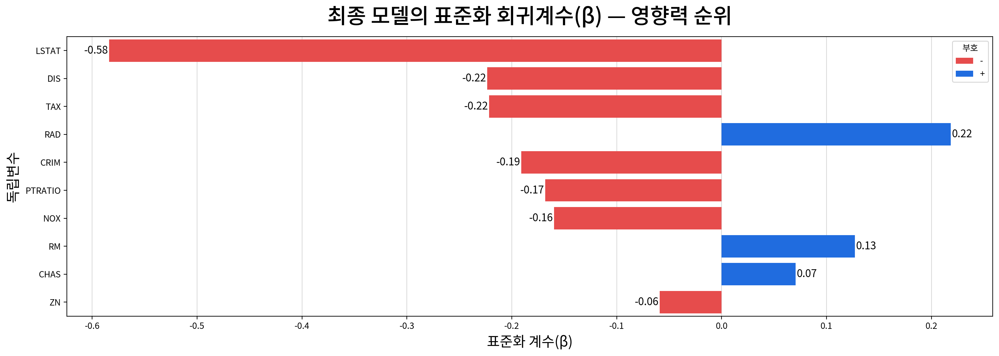

In [75]:
my_ols.plot_beta(final_fit, final_data, height=580, width=1600,
                 title="최종 모델의 표준화 회귀계수(β) — 영향력 순위")

#### 4. 회귀계수 해석 문장

자동 문장은 변환 식과 HC3 유의확률을 반영한다. 모든 비교는 **다른 포함 변수를 고정한 조건부 관계**다. 로그 종속변수의 % 차이는 지수화된 모형 예측값의 비율이며, 별도 재변환 보정 없이 원본 가격의 조건부 산술평균 효과를 보장하지 않는다. ‘평균적으로’라는 자동 표현도 이 한계 안에서 읽는다.

CHAS의 1 증가는 0→1 집단 비교이고, NOX의 1 증가는 관측 범위를 벗어나는 수학적 비교다. 변수별 실제 해석 단위와 단독 상관과의 차이는 마지막 종합 해석에 정리했다.

NOX가 데이터 표기 단위로 0.1 증가하는 비교에서는 지수화 예측값이 약 5.48% 낮다. 이는 해당 계수로 계산한 모형상 조건부 차이이며 관측 범위·다른 변수의 조건을 벗어난 예측은 피한다.

In [76]:
display(Markdown(
    my_ols.report_variables_text(final_fit,
                                 log_y=True, 
                                 log_x=log_x, 
                                 log1p_x=log1p_x, 
                                 reflect_x=reflect_x,
                                 hc3=final_fit.use_hc3_)
))

- **CRIM**의 회귀계수는 **B = -0.0361**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = -3.16**, **p = .002**)      
즉, CRIM가 **1% 증가**할 때 MEDV는 평균적으로 약 **0.04% 감소**하는 것으로 해석된다.
- **ZN**의 회귀계수는 **B = -0.01487**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = -2.24**, **p = .025**)      
즉, **(1+ZN)가 1% 증가**할 때 MEDV는 평균적으로 약 **0.01% 감소**하는 것으로 해석된다.
- **CHAS**의 회귀계수는 **B = 0.1135**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = 2.89**, **p = .004**)      
즉, CHAS가 **1 증가**할 때 MEDV는 평균적으로 약 **12.02% 증가**하는 것으로 해석된다.
- **NOX**의 회귀계수는 **B = -0.5637**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = -3.01**, **p = .003**)      
즉, NOX가 **1 증가**할 때 MEDV는 평균적으로 약 **43.09% 감소**하는 것으로 해석된다.
- **RM**의 회귀계수는 **B = 0.07391**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = 2.79**, **p = .005**)      
즉, RM가 **1 증가**할 때 MEDV는 평균적으로 약 **7.67% 증가**하는 것으로 해석된다.
- **DIS**의 회귀계수는 **B = -0.1693**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = -4.37**, **p < .001**)      
즉, DIS가 **1% 증가**할 때 MEDV는 평균적으로 약 **0.17% 감소**하는 것으로 해석된다.
- **RAD**의 회귀계수는 **B = 0.102**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = 5.16**, **p < .001**)      
즉, RAD가 **1% 증가**할 때 MEDV는 평균적으로 약 **0.10% 증가**하는 것으로 해석된다.
- **TAX**의 회귀계수는 **B = -0.0005373**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = -4.62**, **p < .001**)      
즉, TAX가 **1 증가**할 때 MEDV는 평균적으로 약 **0.05% 감소**하는 것으로 해석된다.
- **PTRATIO**의 회귀계수는 **B = -0.03176**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = -7.1**, **p < .001**)      
즉, PTRATIO가 **1 증가**할 때 MEDV는 평균적으로 약 **3.13% 감소**하는 것으로 해석된다.
- **LSTAT**의 회귀계수는 **B = -0.3972**으로 나타났으며, 이는 **MEDV**에 유의한 요인임을 의미한다. (**t(495) = -10.98**, **p < .001**)      
즉, LSTAT가 **1% 증가**할 때 MEDV는 평균적으로 약 **0.40% 감소**하는 것으로 해석된다.

> ※ **log1p**(=ln(1+·))의 % 해석은 변수 자체가 아니라 **(1+변수)** 기준이며, 변수 자체의 % 변화와 구분한다. (1+변수)의 1% 변화에 대한 탄력성 근사에 원 변수가 커야 한다는 조건을 별도로 붙이지 않는다.      
예측값은 종속변수의 실제 변환에 맞춰 역변환한다(log → exp, log1p → expm1). 독립변수에 log1p를 사용했다는 이유만으로 종속변수의 역변환을 expm1로 바꾸지 않는다.

> ※ 위 **t**와 **유의확률**은 등분산 가정이 충족되지 않은 경우를 대비해 **HC3 로버스트 표준오차**로 계산한 값이다.     
회귀계수(B)와 효과 크기 해석은 일반 OLS와 동일하며,     
표준오차만 이분산에 강건하게 보정되어 유의성 판정이 달라질 수 있다.

### 최종 모델의 회귀분석 가정 검정

#### 1. 선형성 검정

,statistic,p-value,linearity,result
Ramsey RESET,15.127,0.000,False,대립가설 채택 → 선형성 위배(곡선 관계 존재)


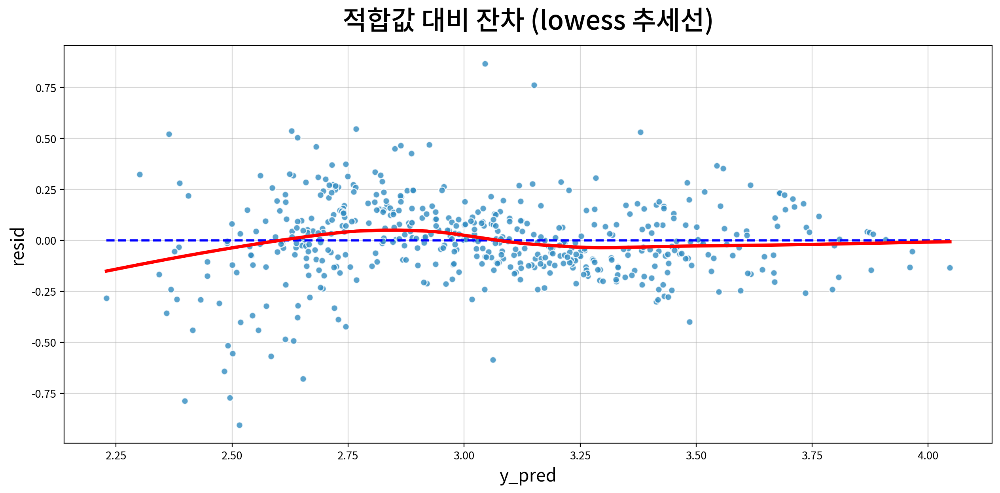

In [77]:
my_ols.test_linear(final_fit, plot=True,
                   title="적합값 대비 잔차 (lowess 추세선)")

#### 2. 정규성 검정

,statistic,p-value,normality,result
Kolmogorov-Smirnov,0.066,0.024,False,대립가설 채택 → 정규성 위배


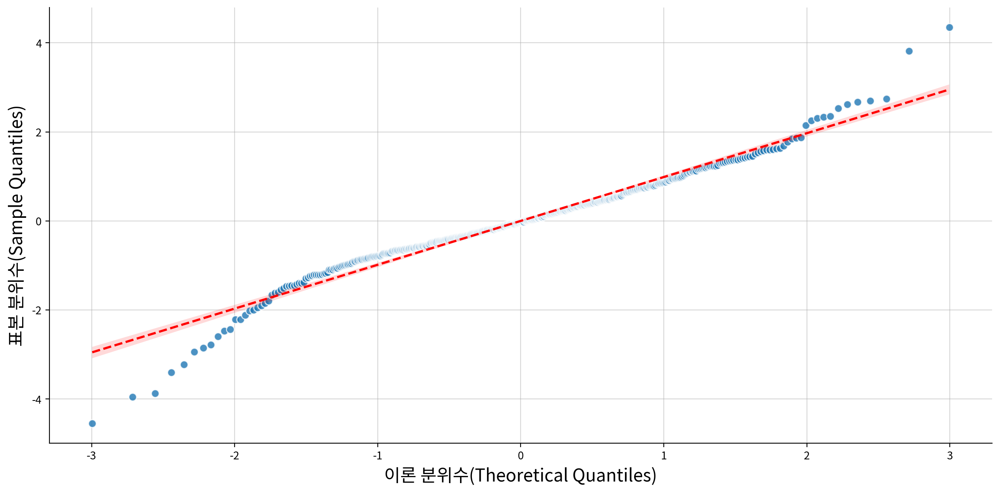

,기대(%),허용범위(%),실제(%),판정
구간,,,,
±1√MSE,68.000,64~72,76.680,위배
±2√MSE,95.000,93~97,94.860,충족
±3√MSE,99.700,99~100,98.620,위배


√MSE = 0.20 · 구간 규칙 판정: 정규성 위배


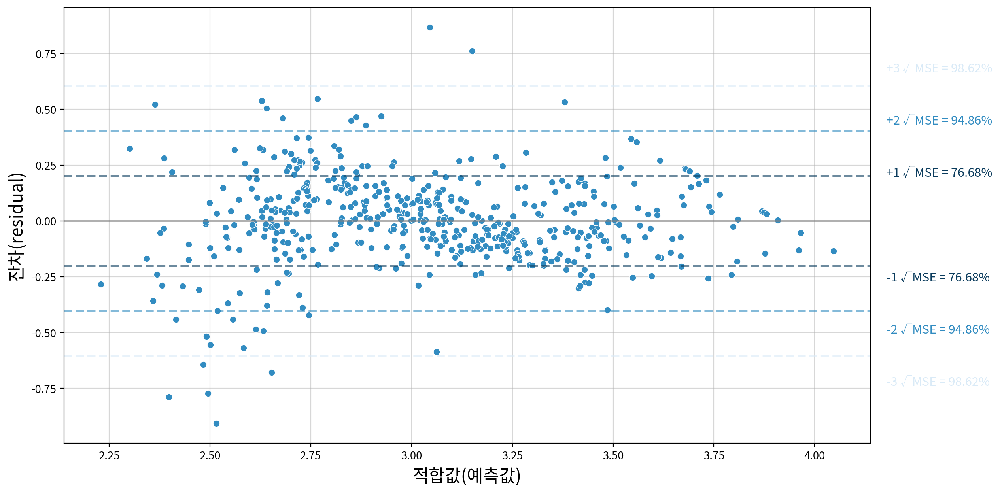

In [78]:
my_ols.test_normal(final_fit, plot=True)

#### 3. 등분산성 검정

In [79]:
my_ols.test_equalvar(final_fit)

,LM statistic,LM p-value,F statistic,F p-value,homoscedasticity,result
Breusch-Pagan,91.866,0.000,10.980,0.000,False,대립가설 채택 → 등분산 아님


#### 4. 독립성 검정

In [80]:
my_ols.test_independent(final_fit)

,statistic,independence,result
Durbin-Watson,0.945,False,독립성 위반 (양(+)의 자기상관)


## 종합 결과 해석과 회고

### 1. 어떤 지역 차이를 관찰했는가

506개 지역에서 중복·결측치는 없었다. MEDV는 평균 22.533천 달러, 중앙값 21.200천 달러였으며 오른쪽으로 치우친 분포를 보였다. 최댓값 50에 16개 지역이 집중되어 있어 상단 가격 정보가 제한된다. 로그변환으로 왜도는 약 1.10에서 −0.33으로 완화됐지만 이 상한 구조가 사라진 것은 아니다.

LSTAT와 MEDV의 Spearman 상관은 −0.853으로 가장 강한 음의 관계였고, RM은 0.634로 양의 관계였다. CHAS 두 집단도 Mann–Whitney U 양측 p≈0.002로 차이가 확인됐다. 이러한 EDA는 관계의 방향과 모양을 설명하지만 다른 지역 특성이 섞여 있는 상태의 관찰이다. 지역 특성 하나를 바꾸면 가격이 그만큼 달라진다는 인과효과로 읽지 않는다.

### 2. 전처리 단계별 비교가 알려주는 것

| 체크포인트 | 변수 수 | 원본 척도 R² | RMSE(천 달러) | MAE(천 달러) |
|---|---:|---:|---:|---:|
| 기준선 | 11 | 0.741 | 4.680 | 3.272 |
| 로그변환 | 10 | 0.777 | 4.336 | 3.075 |
| 이상치 대체 | 10 | 0.775 | 4.359 | 3.080 |
| VIF 점검 | 10 | 0.775 | 4.359 | 3.080 |
| 표준화 | 10 | 0.775 | 4.359 | 3.080 |

로그변환 모형은 기준선보다 변수가 1개 적으면서 RMSE가 약 7.35% 낮았다. 이후 IQR 대체를 누적하면 RMSE가 4.359로 조금 증가했다. 오차 감소를 기준으로 삼았을 때 최종 선택은 **1_로그변환**이며, 이상치 대체나 표준화까지 많이 수행한 모형을 자동으로 선택하지 않았다. 이 미세한 차이를 외부 검증에서 입증된 우위로 표현하지는 않는다.

로그변환 후 IQR 경계를 벗어난 값은 RM 30개, PTRATIO 15개, LSTAT 1개로 총 46개 셀 값이었다. CRIM은 0개였다. ‘46개 셀’은 중복 지역을 포함할 수 있어 46개 지역이 삭제됐다는 뜻이 아니다. 실제로 행은 제거하지 않았다. VIF 기준 10을 초과해 제거된 변수도 없었다. 따라서 이상치 대체 후 VIF 체크포인트가 같은 성능을 보였고, 같은 OLS 설계행렬의 독립변수를 표준화한 단계도 적합값을 바꾸지 않았다.

최종 로그 모형의 모델 척도 R²는 약 0.762이고 원본 척도 R²는 약 0.777이다. 서로 다른 종속변수 척도의 설명력을 구분하며, RMSE·MAE는 실제값과 적합값을 exp로 역변환해 계산했다. 여기서의 exp 예측값에는 별도 재변환 편향 보정이 없으므로 원본 가격의 조건부 산술평균을 추정했다고 단정하지 않는다.

### 3. 무엇이 가격과 관련됐는가

후진소거 후 B·INDUS·AGE가 제외되고 CRIM·ZN·CHAS·NOX·RM·DIS·RAD·TAX·PTRATIO·LSTAT의 10개 변수가 남았다. 유의성은 HC3 기준으로 읽는다. 다음 해석은 다른 포함 변수를 고정했을 때의 **모형상 지수화 예측값의 차이**다.

- **LSTAT:** log–log 계수는 약 −0.397, 표준화 계수는 −0.584로 절댓값이 가장 컸다. LSTAT가 상대적으로 1% 커질 때 예측 가격이 약 0.40% 낮은 관계다. LSTAT가 10에서 10.1로 변하는 상대 증가와 10에서 11로 변하는 1%p 증가는 다르다.
- **RM:** 평균 방 수가 1 증가하는 비교에서 예측 가격은 약 7.67% 높았다. 이는 지역 평균 방 수에 관한 관계이지 개별 주택 증축의 수익률이 아니다.
- **CHAS:** 강변 인접 지역(1)은 비인접 지역(0)에 비해 약 12.02% 높은 예측 가격을 보였다. 집단 크기가 35 대 471로 불균형하므로 이 수치를 보편적인 강변 프리미엄으로 일반화하지 않는다.
- **DIS·RAD:** 각각 log–log 계수 약 −0.169, +0.102였다. 상대적 1% 증가와 약 0.17% 감소, 0.10% 증가의 예측 가격 차이가 관련됐다. RAD는 이산적인 접근성 지수이므로 1% 해석은 모형의 수학적 민감도이지 실제로 지수를 1% 조정하는 정책 효과가 아니다.
- **ZN:** log(1+ZN) 계수는 음수다. 유의확률은 일반 OLS 표에서는 약 0.071이지만 HC3에서는 약 0.025였다. HC3를 사용한 분석에서 일반 유의확률만 보고 ZN을 비유의로 처리하면 안 된다. 계수의 비율 해석은 ZN 자체가 아니라 **1+ZN**을 기준으로 한다.
- **NOX·TAX·PTRATIO·CRIM:** 다른 포함 변수를 통제한 계수는 음수였다. 변수마다 단위와 변환이 다르므로 비표준화 계수의 숫자만으로 중요도를 비교하지 않는다. 특히 NOX의 관측 범위는 0.385~0.871이므로 자동 문장의 ‘1 증가’는 관측 범위를 벗어난 비교다. 데이터 표기 단위의 0.1 증가처럼 해석 가능한 변화량을 따로 정해야 한다.

표준화 계수는 이번 표본과 변수 구성에 의존하는 조건부 비교다. LSTAT가 가장 큰 절댓값을 보였다는 이유로 사회경제적 지표 하나가 가격을 결정한다고 단정하거나, 개인의 특성을 평가하는 데 적용하지 않는다. 지역 단위의 분석 결과를 개인 단위 관계로 확대할 수도 없다.

### 4. 단독 상관과 회귀계수의 방향이 다른 이유

DIS는 단독 상관 +0.446에서 최종 회귀계수 −0.169로, RAD는 −0.347에서 +0.102로 방향이 달라졌다. ZN도 단독 상관은 +0.438이지만 최종 계수는 음수다. 이는 오류라는 뜻이 아니라 **서로 다른 질문을 비교하고 있음**을 보여준다. EDA에서는 두 변수만의 순위 관계를 보았고, 최종 모형에서는 로그변환을 적용한 뒤 다른 포함 변수를 동시에 통제했다.

여러 환경·접근성·사회경제적 특성이 함께 움직이는 자료에서는 단독 관계와 조건부 관계가 달라질 수 있다. 다만 부호가 달라졌다는 사실만으로 특정 교란 경로나 원인을 입증한 것은 아니다. 최종 모형의 VIF는 최대 약 7.194로 설정한 기준 10 아래지만 변수 간 중복이 전혀 없다는 뜻도 아니다. EDA의 상관과 다변량 회귀를 연결해 설명하되 인과적 설명은 유보한다.

### 5. 진단 결과와 활용 한계

Ramsey RESET F=15.127에서 p<0.001, 사용한 잔차 정규성 검정에서 통계량 0.066·p≈0.024, Breusch–Pagan F=10.980에서 p<0.001이었다. 모형의 함수 형태와 잔차 분포·분산에 주의가 필요하다. RESET 기각이 특정 비선형 항 하나의 필요성을 증명하는 것은 아니다. HC3는 계수의 표준오차를 보정하지만 잔차 구조 자체를 수정하지 않는다.

DW=0.945는 현재 행 순서에서 양의 잔차 연관성을 시사하는 값이지만, 시간이나 공간 구조를 명시하지 않은 상태에서 시계열 자기상관 또는 공간적 의존성을 확정하지 않는다. 관측치 수집 구조에 대한 별도 확인이 필요하다. 가격 상한, 지역 단위 자료라는 점, 인종 구성에 기반한 가공 지표 B와 사회경제적 변수의 해석 문제도 현재 시세 예측·의사결정 적용을 제한한다.

### 6. 최종 결론과 회고

이번 절차에서는 **로그변환 모형이 10개 변수로 원본 가격 변동의 약 77.7%를 표본 내에서 설명했고, 기준선 대비 오차를 줄였다.** 그러나 이를 예측 정확도 77.7%, 새 지역에 대한 검증 성능, 현재 매물의 가격 산정 능력으로 표현하지 않는다.

전처리별 효과가 항상 누적 개선되는 것은 아니었고, 관계의 단순한 방향보다 변수 통제·척도·가정을 함께 설명하는 것이 중요했다. 모델 선택과 유의성 확인을 같은 표본에서 수행했으므로 계수의 유의확률을 독립적인 확증 결과처럼 취급하지 않는다. 이후 실제 예측 업무로 확장하려면 외부 검증과 데이터 수집 구조·상한 문제 등을 따로 점검해야 한다. 현재 노트북의 분석 방법은 유지하고 이 한계를 결과 보고에 반영했다.